In [94]:
pip install folium 

Note: you may need to restart the kernel to use updated packages.


In [95]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium


In [96]:
fdf_gdf = pd.read_csv(r'C:\Users\raclo\Documents\Bootcamp\Project 3\fdf_gdf.csv', low_memory=False, sep=",")

In [97]:
fdf_gdf.head()

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual,distance,month,year,season,day_of_week,holiday,is_weekend,ride_duration,start_ward,end_ward,ride_duration_min
0,7368109,electric_bike,2023-05-05 10:57:59,2023-05-05 11:21:16,0,0.0,17th St & Rhode Island Ave NW,31210.0,38.880000,-77.010000,38.906767,-77.038627,member,3.872587,5,2023,Spring,Friday,No,No,0 days 00:23:17,6,2,23.283333
1,6480084,classic_bike,2023-02-08 17:29:29,2023-02-08 17:52:32,Hamlin & 7th St NE,31514.0,Adams Mill & Columbia Rd NW,31104.0,38.927497,-76.997194,38.922849,-77.042525,casual,3.955272,2,2023,Winter,Wednesday,No,No,0 days 00:23:03,5,1,23.050000
2,6546649,classic_bike,2023-02-17 10:40:44,2023-02-17 10:52:14,Eckington Pl & Q St NE,31505.0,New Jersey Ave & F St NW,31655.0,38.910972,-77.004950,38.897108,-77.011616,member,1.645987,2,2023,Winter,Friday,No,No,0 days 00:11:30,5,6,11.500000
3,8494852,classic_bike,2023-07-21 21:31:20,2023-07-21 21:38:29,New Hampshire Ave & Ward Pl NW,31212.0,16th & R St NW,31282.0,38.905711,-77.047318,38.912652,-77.036278,casual,1.228064,7,2023,Summer,Friday,No,No,0 days 00:07:09,2,2,7.150000
4,10613115,electric_bike,2023-12-19 17:34:05,2023-12-19 17:39:06,14th & Belmont St NW,31119.0,14th & Otis Pl NW,31131.0,38.921051,-77.031750,38.934405,-77.032687,member,1.487133,12,2023,Winter,Tuesday,No,No,0 days 00:05:01,1,1,5.016667


In [98]:
pd.set_option("display.max_columns", None)

In [99]:
fdf_gdf.dtypes

ride_id                 int64
rideable_type          object
started_at             object
ended_at               object
start_station_name     object
start_station_id      float64
end_station_name       object
end_station_id        float64
start_lat             float64
start_lng             float64
end_lat               float64
end_lng               float64
member_casual          object
distance              float64
month                   int64
year                    int64
season                 object
day_of_week            object
holiday                object
is_weekend             object
ride_duration          object
start_ward              int64
end_ward                int64
ride_duration_min     float64
dtype: object

In [100]:
fdf_gdf.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 839783 entries, 0 to 839782
Data columns (total 24 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   ride_id             839783 non-null  int64  
 1   rideable_type       839783 non-null  object 
 2   started_at          839783 non-null  object 
 3   ended_at            839783 non-null  object 
 4   start_station_name  839783 non-null  object 
 5   start_station_id    839783 non-null  float64
 6   end_station_name    839783 non-null  object 
 7   end_station_id      839783 non-null  float64
 8   start_lat           839783 non-null  float64
 9   start_lng           839783 non-null  float64
 10  end_lat             839783 non-null  float64
 11  end_lng             839783 non-null  float64
 12  member_casual       839783 non-null  object 
 13  distance            839783 non-null  float64
 14  month               839783 non-null  int64  
 15  year                839783 non-nul

In [101]:
# Convert categorical columns to category type for memory efficiency
fdf_gdf["rideable_type"] = fdf_gdf["rideable_type"].astype("category")
fdf_gdf["start_station_name"] = fdf_gdf["start_station_name"].astype("category")
fdf_gdf["end_station_name"] = fdf_gdf["end_station_name"].astype("category")
fdf_gdf["member_casual"] = fdf_gdf["member_casual"].astype("category")
fdf_gdf["day_of_week"] = fdf_gdf["day_of_week"].astype("category")
fdf_gdf["holiday"] = fdf_gdf["holiday"].astype("category")

# Convert started_at and ended_at to datetime for memory efficiency
fdf_gdf['started_at'] = pd.to_datetime(fdf_gdf['started_at'])
fdf_gdf['ended_at'] = pd.to_datetime(fdf_gdf['ended_at'])


fdf_gdf['month'] = fdf_gdf['month'].astype('int8')
fdf_gdf["year"] = fdf_gdf["year"].astype("category")

fdf_gdf["ride_duration"] = pd.to_timedelta(fdf_gdf["ride_duration"])

# Convert ride_duration to minutes before filtering
fdf_gdf["ride_duration_min"] = fdf_gdf["ride_duration"].dt.total_seconds() / 60

In [102]:
fdf_gdf.head()

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual,distance,month,year,season,day_of_week,holiday,is_weekend,ride_duration,start_ward,end_ward,ride_duration_min
0,7368109,electric_bike,2023-05-05 10:57:59,2023-05-05 11:21:16,0,0.0,17th St & Rhode Island Ave NW,31210.0,38.880000,-77.010000,38.906767,-77.038627,member,3.872587,5,2023,Spring,Friday,No,No,0 days 00:23:17,6,2,23.283333
1,6480084,classic_bike,2023-02-08 17:29:29,2023-02-08 17:52:32,Hamlin & 7th St NE,31514.0,Adams Mill & Columbia Rd NW,31104.0,38.927497,-76.997194,38.922849,-77.042525,casual,3.955272,2,2023,Winter,Wednesday,No,No,0 days 00:23:03,5,1,23.050000
2,6546649,classic_bike,2023-02-17 10:40:44,2023-02-17 10:52:14,Eckington Pl & Q St NE,31505.0,New Jersey Ave & F St NW,31655.0,38.910972,-77.004950,38.897108,-77.011616,member,1.645987,2,2023,Winter,Friday,No,No,0 days 00:11:30,5,6,11.500000
3,8494852,classic_bike,2023-07-21 21:31:20,2023-07-21 21:38:29,New Hampshire Ave & Ward Pl NW,31212.0,16th & R St NW,31282.0,38.905711,-77.047318,38.912652,-77.036278,casual,1.228064,7,2023,Summer,Friday,No,No,0 days 00:07:09,2,2,7.150000
4,10613115,electric_bike,2023-12-19 17:34:05,2023-12-19 17:39:06,14th & Belmont St NW,31119.0,14th & Otis Pl NW,31131.0,38.921051,-77.031750,38.934405,-77.032687,member,1.487133,12,2023,Winter,Tuesday,No,No,0 days 00:05:01,1,1,5.016667


In [103]:
f = folium.Figure(width=700, height=500)
m = folium.Map(location=[38.89511, -77.03637], zoom_start=12, min_zoom=9).add_to(f)

folium.Marker([38.880000, -77.010000]).add_to(m) 
folium.Marker([38.927497, -76.997194]).add_to(m) 
folium.Marker([38.910972, -77.004950]).add_to(m)
folium.Marker([38.905711, -77.047318]).add_to(m)
folium.Marker([38.921051, -77.031750]).add_to(m)

m


In [104]:
# Count occurrences of each station in start and end columns
start_counts = fdf_gdf['start_station_name'].value_counts()
end_counts = fdf_gdf['end_station_name'].value_counts()

# Combine the counts
total_counts = start_counts.add(end_counts, fill_value=0).sort_values(ascending=False)

# Get the top 50 stations
top_50_stations = total_counts.head(50).reset_index()
top_50_stations.columns = ['Station Name', 'Total Traffic']

# Display the table
top_50_stations.head()

,Station Name,Total Traffic
0,0,35830.0
1,Columbus Circle / Union Station,22426.0
2,New Hampshire Ave & T St NW,19539.0
3,15th & P St NW,17777.0
4,5th & K St NW,16430.0


In [105]:
filtered_df = fdf_gdf[fdf_gdf['start_station_name'] == '0']
filtered_df

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual,distance,month,year,season,day_of_week,holiday,is_weekend,ride_duration,start_ward,end_ward,ride_duration_min
0,7368109,electric_bike,2023-05-05 10:57:59,2023-05-05 11:21:16,0,0.0,17th St & Rhode Island Ave NW,31210.0,38.88,-77.01,38.906767,-77.038627,member,3.872587,5,2023,Spring,Friday,No,No,0 days 00:23:17,6,2,23.283333
6,8909726,electric_bike,2023-08-18 18:39:06,2023-08-18 18:44:20,0,0.0,Washington & Independence Ave SW/HHS,31272.0,38.89,-77.01,38.886978,-77.013769,casual,0.468326,8,2023,Summer,Friday,No,No,0 days 00:05:14,6,6,5.233333
37,10250438,electric_bike,2023-11-14 17:56:51,2023-11-14 17:59:57,0,0.0,16th & Irving St NW,31122.0,38.94,-77.04,38.928893,-77.036250,member,1.276924,11,2023,Autumn,Tuesday,No,No,0 days 00:03:06,4,1,3.100000
97,9555521,electric_bike,2023-09-30 13:29:39,2023-09-30 13:53:25,0,0.0,Jefferson Dr & 14th St SW,31247.0,38.91,-77.06,38.888553,-77.032427,casual,3.373574,9,2023,Autumn,Saturday,No,Yes,0 days 00:23:46,2,2,23.766667
128,10085039,electric_bike,2023-11-03 07:23:07,2023-11-03 07:27:02,0,0.0,Ward Circle / American University,31301.0,38.95,-77.09,38.938736,-77.087171,member,1.276171,11,2023,Autumn,Friday,No,No,0 days 00:03:55,3,3,3.916667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
839564,9230566,electric_bike,2023-09-08 13:23:31,2023-09-08 13:34:38,0,0.0,Lamont & Mt Pleasant NW,31107.0,38.91,-77.02,38.931900,-77.038800,member,2.928354,9,2023,Autumn,Friday,No,No,0 days 00:11:07,2,1,11.116667
839649,7136206,electric_bike,2023-04-16 11:31:05,2023-04-16 11:42:38,0,0.0,5th & Morse St NE,31536.0,38.90,-77.04,38.907287,-76.999167,casual,3.625115,4,2023,Spring,Sunday,Yes,Yes,0 days 00:11:33,2,5,11.550000
839654,10676758,electric_bike,2023-12-29 17:10:59,2023-12-29 17:31:23,0,0.0,3rd & N St NE,31540.0,38.88,-76.99,38.907073,-77.002109,casual,3.187574,12,2023,Winter,Friday,No,No,0 days 00:20:24,6,6,20.400000
839694,9864257,electric_bike,2023-10-20 09:17:43,2023-10-20 09:30:22,0,0.0,1st & M St SE,31650.0,38.88,-77.00,38.876893,-77.006072,member,0.628987,10,2023,Autumn,Friday,No,No,0 days 00:12:39,6,6,12.650000


### Replace missing start station names with nearest station names

In [106]:
import numpy as np
from scipy.spatial import KDTree

# Filter out rows where start_station_name is NOT "0" (valid stations)
valid_stations = fdf_gdf[fdf_gdf["start_station_name"] != "0"][["start_lat", "start_lng", "start_station_name"]]

# Build a KDTree for fast nearest neighbor search
station_tree = KDTree(valid_stations[["start_lat", "start_lng"]].values)

# Get indices of missing stations
missing_indices = fdf_gdf[fdf_gdf["start_station_name"] == "0"].index

# Find the nearest valid station for each missing station
for idx in missing_indices:
    lat, lng = fdf_gdf.loc[idx, ["start_lat", "start_lng"]]
    dist, nearest_idx = station_tree.query([lat, lng])  # Find nearest valid station
    fdf_gdf.at[idx, "start_station_name"] = valid_stations.iloc[nearest_idx]["start_station_name"]

# Check results
print(fdf_gdf.loc[missing_indices, ["start_station_name", "start_lat", "start_lng"]])


                          start_station_name  start_lat  start_lng
0                       14th & Harvard St NW      38.88     -77.01
6       Washington & Independence Ave SW/HHS      38.89     -77.01
37                       17th & Upshur St NW      38.94     -77.04
97                   Wisconsin Ave & O St NW      38.91     -77.06
128          Fessenden St & Wisconsin Ave NW      38.95     -77.09
...                                      ...        ...        ...
839564                         8th & O St NW      38.91     -77.02
839649         18th St & Pennsylvania Ave NW      38.90     -77.04
839654         12th St & Pennsylvania Ave SE      38.88     -76.99
839694                         3rd & G St SE      38.88     -77.00
839758         22nd & I St NW / Foggy Bottom      38.90     -77.05

[35830 rows x 3 columns]


In [107]:
ward_counts = fdf_gdf.groupby(["start_ward", "end_ward"]).size().reset_index(name="ride_count")

# Display results
print(ward_counts)


    start_ward  end_ward  ride_count
0            1         1       45262
1            1         2       60112
2            1         3        4519
3            1         4        5481
4            1         5        7390
..         ...       ...         ...
59           8         4          47
60           8         5         517
61           8         6        8776
62           8         7         620
63           8         8        3745

[64 rows x 3 columns]


In [108]:
# Create a pivot table with start_ward as rows and end_ward as columns
ward_matrix = ward_counts.pivot(index="start_ward", columns="end_ward", values="ride_count").fillna(0)

# Display the matrix
print(ward_matrix)


end_ward        1       2     3     4      5       6     7      8
start_ward                                                       
1           45262   60112  4519  5481   7390    9725   176    319
2           47644  223734  5002  2887  13591   59161  1027   2097
3            5055    7641  9062   436    244     653    11     46
4            6169    4546   503  6398   2084    1066    21     51
5            6912   14810   242  1741  17164   19843   796    665
6            7218   55113   436   548  18528  120941  5725  10193
7             122    1012     7    22    684    5496  2979    747
8             234    1765    22    47    517    8776   620   3745


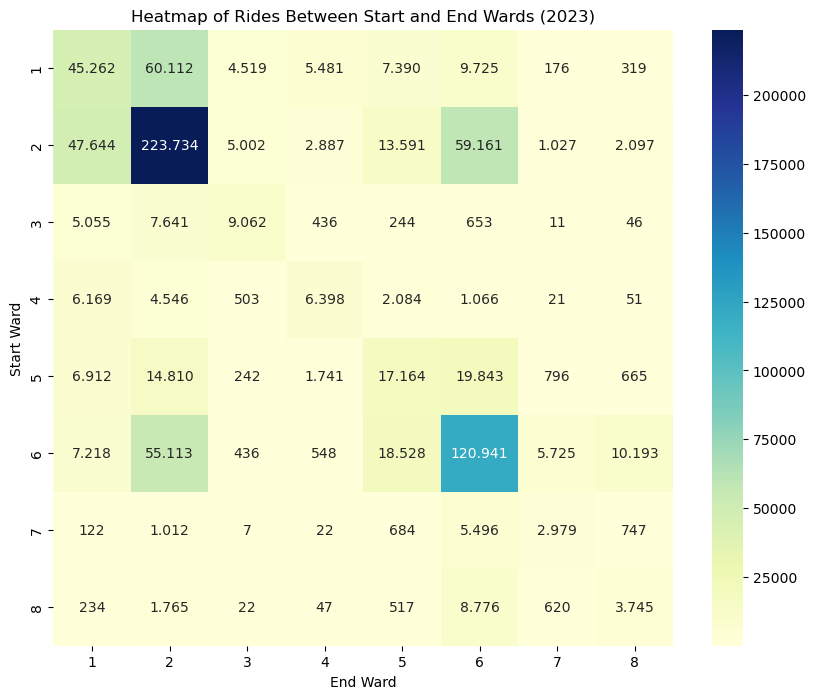

In [109]:
# Heatmap to show rides between wards
import seaborn as sns
import matplotlib.pyplot as plt
import locale

# Set locale to use dots as thousands separator
locale.setlocale(locale.LC_NUMERIC, 'de_DE.UTF-8')  # For German formatting

# Function to format numbers with dots as thousands separator
def format_with_dot(x):
    return locale.format_string("%d", x, grouping=True)

# Apply the format to the matrix using map
formatted_matrix = ward_matrix.stack().map(format_with_dot).unstack()

# Create a heatmap with formatted annotations
plt.figure(figsize=(10, 8))
sns.heatmap(
    ward_matrix, 
    annot=formatted_matrix, 
    cmap="YlGnBu", 
    fmt="s",  # Treats the annotations as strings
    cbar=True,
    annot_kws={"size": 10}  # Smaller font size for annotations
)

# Set labels and title
plt.title('Heatmap of Rides Between Start and End Wards (2023)')
plt.xlabel('End Ward')
plt.ylabel('Start Ward')

# Show the plot
plt.show()

In [110]:
# Count the number of rides per start_ward and sort by descending order
start_ward_counts = fdf_gdf.groupby("start_ward").size().reset_index(name="ride_count").sort_values(by="ride_count", ascending=False)

# Count the number of rides per end_ward and sort by descending order
end_ward_counts = fdf_gdf.groupby("end_ward").size().reset_index(name="ride_count").sort_values(by="ride_count", ascending=False)

# Display the results
print("Rides per Start Ward (Descending Order):")
print(start_ward_counts)

print("\nRides per End Ward (Descending Order):")
print(end_ward_counts)


Rides per Start Ward (Descending Order):
   start_ward  ride_count
1           2      355143
5           6      218702
0           1      132984
4           5       62173
2           3       23148
3           4       20838
7           8       15726
6           7       11069

Rides per End Ward (Descending Order):
   end_ward  ride_count
1         2      368733
5         6      225661
0         1      118616
4         5       60202
2         3       19793
7         8       17863
3         4       17560
6         7       11355


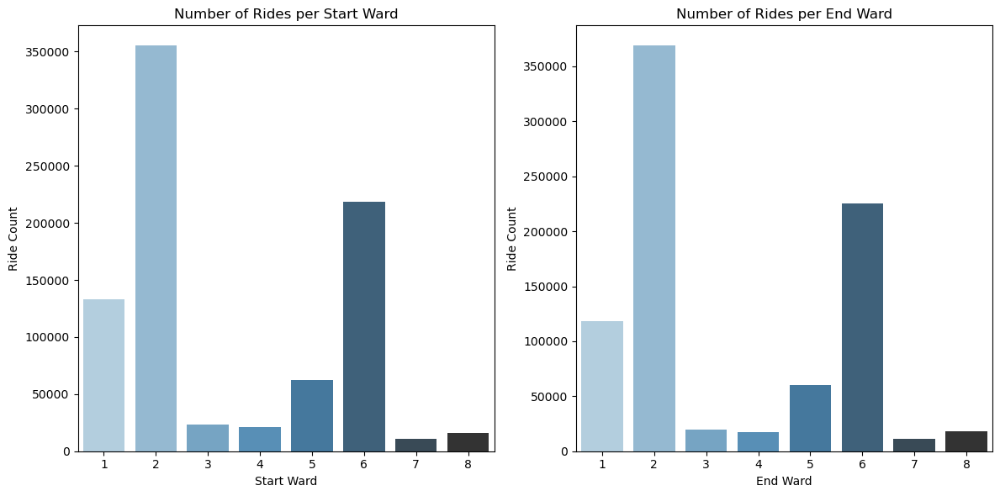

In [111]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the size of the plots
plt.figure(figsize=(12, 6))

# Plot the rides per start ward
plt.subplot(1, 2, 1)
sns.barplot(data=start_ward_counts, x="start_ward", y="ride_count", hue="start_ward", palette="Blues_d", legend=False)
plt.title('Number of Rides per Start Ward')
plt.xlabel('Start Ward')
plt.ylabel('Ride Count')


# Plot the rides per end ward
plt.subplot(1, 2, 2)
sns.barplot(data=end_ward_counts, x="end_ward", y="ride_count", hue="end_ward", palette="Blues_d", legend=False)
plt.title('Number of Rides per End Ward')
plt.xlabel('End Ward')
plt.ylabel('Ride Count')

# Adjust layout and display the plots
plt.tight_layout()
plt.show()


### Top 50 Stations

In [112]:
# Ensure 'start_station_name' and 'end_station_name' are of type 'object' (string) to avoid the category type issue
fdf_gdf['start_station_name'] = fdf_gdf['start_station_name'].astype(str)
fdf_gdf['end_station_name'] = fdf_gdf['end_station_name'].astype(str)

# Count the number of rides per start station and sort in descending order
start_station_counts = fdf_gdf.groupby("start_station_name").size().reset_index(name="ride_count")
start_station_counts_sorted = start_station_counts.sort_values(by="ride_count", ascending=False)

# Count the number of rides per end station and sort in descending order
end_station_counts = fdf_gdf.groupby("end_station_name").size().reset_index(name="ride_count")
end_station_counts_sorted = end_station_counts.sort_values(by="ride_count", ascending=False)

# Combine the start and end stations counts and sort them in descending order
combined_station_counts = pd.concat([start_station_counts_sorted, end_station_counts_sorted]).groupby("start_station_name").sum().reset_index()

# Sort by total ride count in descending order and get the top 50 stations
top_50_stations = combined_station_counts.sort_values(by="ride_count", ascending=False).head(50)

# Display the result
print(top_50_stations)


                                    start_station_name  ride_count  \
239                    Columbus Circle / Union Station       11003   
326                        New Hampshire Ave & T St NW        9692   
65                                      15th & P St NW        8708   
208                                      8th & O St NW        8427   
183                                      5th & K St NW        8030   
253  Eastern Market Metro / Pennsylvania Ave & 8th ...        7905   
109                                      1st & M St NE        7836   
51                                      14th & V St NW        7629   
315               Massachusetts Ave & Dupont Circle NW        7268   
94                            18th St & Wyoming Ave NW        6967   
189                                      6th & H St NE        6604   
48                                      14th & R St NW        6573   
297                                   Lincoln Memorial        6493   
179                 

In [113]:
top_50_stations.tail(10)

,start_station_name,ride_count,end_station_name
248,Convention Center / 7th & M St NW,4569,0
176,4th & M St SW,4533,0
193,7th & F St NW / National Portrait Gallery,4519,0
121,20th & O St NW / Dupont South,4507,0
107,1st & K St NE,4474,0
135,23rd & M St NW,4344,0
149,37th & O St NW / Georgetown University,4339,0
393,Wisconsin Ave & O St NW,4266,0
56,14th St & Rhode Island Ave NW,4262,0
308,Maine Ave & 9th St SW,4245,0


In [114]:
# Ensure 'start_station_name' and 'end_station_name' are of type 'object' (string) to avoid the category type issue
fdf_gdf['start_station_name'] = fdf_gdf['start_station_name'].astype(str)
fdf_gdf['end_station_name'] = fdf_gdf['end_station_name'].astype(str)

# Count the number of rides per start station and sort in descending order
start_station_counts = fdf_gdf.groupby("start_station_name").size().reset_index(name="ride_count")
start_station_counts_sorted = start_station_counts.sort_values(by="ride_count", ascending=False)

# Count the number of rides per end station and sort in descending order
end_station_counts = fdf_gdf.groupby("end_station_name").size().reset_index(name="ride_count")
end_station_counts_sorted = end_station_counts.sort_values(by="ride_count", ascending=False)

# Combine the start and end stations counts and sort them in descending order
combined_station_counts = pd.concat([start_station_counts_sorted, end_station_counts_sorted]).groupby("start_station_name").sum().reset_index()

# Sort by total ride count in descending order and get the top 50 stations
top_50_stations = combined_station_counts.sort_values(by="ride_count", ascending=False).head(50)

# Merge top 50 stations with the original dataframe to get coordinates (start_lat, start_lng)
# First, drop duplicates to keep only one row per station with its coordinates
unique_stations = fdf_gdf[['start_station_name', 'start_lat', 'start_lng']].drop_duplicates(subset='start_station_name', keep='first')

# Now merge the top 50 stations with the unique coordinates
top_50_stations_with_coords = top_50_stations.merge(
    unique_stations,
    on='start_station_name',
    how='left'
)

# Display the result

top_50_stations_with_coords.head()



,start_station_name,ride_count,end_station_name,start_lat,start_lng
0,Columbus Circle / Union Station,11003,0,38.896960,-77.004930
1,New Hampshire Ave & T St NW,9692,0,38.915544,-77.038252
2,15th & P St NW,8708,0,38.909801,-77.034427
3,8th & O St NW,8427,0,38.908640,-77.022770
4,5th & K St NW,8030,0,38.903040,-77.019027


### Top 100 stations

In [115]:
# Ensure 'start_station_name' and 'end_station_name' are of type 'object' (string) to avoid the category type issue
fdf_gdf['start_station_name'] = fdf_gdf['start_station_name'].astype(str)
fdf_gdf['end_station_name'] = fdf_gdf['end_station_name'].astype(str)

# Count the number of rides per start station and sort in descending order
start_station_counts = fdf_gdf.groupby("start_station_name").size().reset_index(name="ride_count")
start_station_counts_sorted = start_station_counts.sort_values(by="ride_count", ascending=False)

# Count the number of rides per end station and sort in descending order
end_station_counts = fdf_gdf.groupby("end_station_name").size().reset_index(name="ride_count")
end_station_counts_sorted = end_station_counts.sort_values(by="ride_count", ascending=False)

# Combine the start and end stations counts and sort them in descending order
combined_station_counts = pd.concat([start_station_counts_sorted, end_station_counts_sorted]).groupby("start_station_name").sum().reset_index()

# Sort by total ride count in descending order and get the top 100 stations
top_100_stations = combined_station_counts.sort_values(by="ride_count", ascending=False).head(100)

# Merge top 100 stations with the original dataframe to get coordinates (start_lat, start_lng)
# First, drop duplicates to keep only one row per station with its coordinates
unique_stations = fdf_gdf[['start_station_name', 'start_lat', 'start_lng']].drop_duplicates(subset='start_station_name', keep='first')

# Now merge the top 100 stations with the unique coordinates
top_100_stations_with_coords = top_100_stations.merge(
    unique_stations,
    on='start_station_name',
    how='left'
)

# Display the result
print(top_100_stations_with_coords.head(100))

top_100_stations_with_coords.head()

                 start_station_name  ride_count end_station_name  start_lat  \
0   Columbus Circle / Union Station       11003                0  38.896960   
1       New Hampshire Ave & T St NW        9692                0  38.915544   
2                    15th & P St NW        8708                0  38.909801   
3                     8th & O St NW        8427                0  38.908640   
4                     5th & K St NW        8030                0  38.903040   
..                              ...         ...              ...        ...   
95            Vermont Ave & I St NW        3267                0  38.901136   
96                    3rd & G St SE        3267                0  38.881185   
97                14th & Otis Pl NW        3265                0  38.934405   
98                   10th & K St NW        3249                0  38.902400   
99         20th St & Florida Ave NW        3242                0  38.915400   

    start_lng  
0  -77.004930  
1  -77.038252  
2  

,start_station_name,ride_count,end_station_name,start_lat,start_lng
0,Columbus Circle / Union Station,11003,0,38.896960,-77.004930
1,New Hampshire Ave & T St NW,9692,0,38.915544,-77.038252
2,15th & P St NW,8708,0,38.909801,-77.034427
3,8th & O St NW,8427,0,38.908640,-77.022770
4,5th & K St NW,8030,0,38.903040,-77.019027


In [116]:
# Visualise the top 50 stations on a map

import folium
from folium import plugins
import numpy as np

# Function to get a color based on the ride count (you can adjust the color scale)
def get_marker_color(ride_count, max_ride_count, min_ride_count):
    # Normalize the ride count to a value between 0 and 1
    normalized = (ride_count - min_ride_count) / (max_ride_count - min_ride_count)
    
    # You can choose a color scale from any of the pre-defined scales or create a custom one
    # Example: Use a simple red to green scale
    color = f"#{int(255 * (1 - normalized)):02x}{int(255 * normalized):02x}00"
    
    return color

# Find the max and min ride counts to normalize the color scale
max_ride_count = top_50_stations_with_coords['ride_count'].max()
min_ride_count = top_50_stations_with_coords['ride_count'].min()

# Create a folium map centered around a general area (e.g., DC)
m = folium.Map(location=[38.90, -77.04], zoom_start=12, min_zoom=11, width="80%", height="60%")  # Adjust width and height here

# Loop through the top 50 stations and add them as circle markers with color based on ride count
for _, row in top_50_stations_with_coords.iterrows():
    # Get color based on the number of rides
    marker_color = get_marker_color(row['ride_count'], max_ride_count, min_ride_count)
    
    folium.CircleMarker(
        location=[row['start_lat'], row['start_lng']],
        radius=8,  # Adjust the radius size of the marker
        color=marker_color,
        fill=True,
        fill_color=marker_color,
        fill_opacity=0.7,
        popup=f"{row['start_station_name']}: {row['ride_count']} rides",  # Shows station name and ride count
        tooltip=row['start_station_name']  # Tooltip shows the station name when hovered
    ).add_to(m)

# Save the map to an HTML file
m.save("top_50_stations_colored_map.html")

# If you are working in a Jupyter notebook or similar environment, display the map inline
m


In [117]:
# Visualise the top 100 stations on a map

import folium
from folium import plugins
import numpy as np

# Function to get a color based on the ride count (you can adjust the color scale)
def get_marker_color(ride_count, max_ride_count, min_ride_count):
    # Normalize the ride count to a value between 0 and 1
    normalized = (ride_count - min_ride_count) / (max_ride_count - min_ride_count)
    
    # You can choose a color scale from any of the pre-defined scales or create a custom one
    # Example: Use a simple red to green scale
    color = f"#{int(255 * (1 - normalized)):02x}{int(255 * normalized):02x}00"
    
    return color

# Find the max and min ride counts to normalize the color scale
max_ride_count = top_100_stations_with_coords['ride_count'].max()
min_ride_count = top_100_stations_with_coords['ride_count'].min()

# Create a folium map centered around a general area (e.g., DC)
m = folium.Map(location=[38.90, -77.04], zoom_start=12, min_zoom=11, width="80%", height="60%")  # Adjust width and height here

# Loop through the top 100 stations and add them as circle markers with color based on ride count
for _, row in top_100_stations_with_coords.iterrows():
    # Get color based on the number of rides
    marker_color = get_marker_color(row['ride_count'], max_ride_count, min_ride_count)
    
    folium.CircleMarker(
        location=[row['start_lat'], row['start_lng']],
        radius=8,  # Adjust the radius size of the marker
        color=marker_color,
        fill=True,
        fill_color=marker_color,
        fill_opacity=0.7,
        popup=f"{row['start_station_name']}: {row['ride_count']} rides",  # Shows station name and ride count
        tooltip=row['start_station_name']  # Tooltip shows the station name when hovered
    ).add_to(m)

# Save the map to an HTML file
m.save("top_100_stations_colored_map.html")

# If you are working in a Jupyter notebook or similar environment, display the map inline
m


### Top 100 Stations with Ward boundaries for Ward 2 and 7

In [118]:
import geopandas as gpd

# Load GeoJSON data
geojson_file = "wards_from_2022.geojson"
wards_gdf = gpd.read_file(geojson_file)

# 🔹 Convert ALL datetime columns to strings
for col in wards_gdf.select_dtypes(include=["datetime64[ns]"]).columns:
    wards_gdf[col] = wards_gdf[col].astype(str)


In [119]:
import json

# 🔹 Convert GeoDataFrame to a JSON string and force datetime conversion
wards_json = json.loads(json.dumps(wards_gdf.__geo_interface__, default=str))


In [120]:
import folium

# Create the map
m = folium.Map(location=[38.90, -77.04], zoom_start=12)

# 🔹 Add the cleaned GeoJSON to the map
folium.GeoJson(wards_json).add_to(m)

# Save and show the map
m.save("fixed_map.html")
m


In [121]:
# import folium
# import geopandas as gpd
# import json

# # Step 1: Create the folium map centered around the area
# m = folium.Map(location=[38.90, -77.04], zoom_start=12)

# # Step 2: Load and process ward boundaries
# geojson_file = "wards_from_2022.geojson"
# wards_gdf = gpd.read_file(geojson_file)

# # Convert all datetime columns to strings in case there's any Timestamp data
# for col in wards_gdf.select_dtypes(include=["datetime64[ns]"]).columns:
#     wards_gdf[col] = wards_gdf[col].astype(str)

# # Convert GeoDataFrame to GeoJSON with all Timestamps as strings
# wards_json = json.loads(json.dumps(wards_gdf.__geo_interface__, default=str))

# # Add the ward polygons to the map
# folium.GeoJson(wards_json).add_to(m)

# # Step 3: Prepare the top 100 stations data (make sure the index is reset and you have the right columns)
# top_100_stations_with_coords = top_100_stations_with_coords.reset_index(drop=True)
# top_100_stations_coords = top_100_stations_with_coords[['start_station_name', 'ride_count', 'start_lat', 'start_lng']]

# # Step 4: Add markers for each station with color based on ride count
# for _, row in top_100_stations_coords.iterrows():
#     # Determine color based on the ride count
#     color = 'green' if row['ride_count'] < 200 else 'orange' if row['ride_count'] < 1000 else 'red'

#     # Add CircleMarker for each station
#     folium.CircleMarker(
#         location=[row['start_lat'], row['start_lng']],
#         radius=8,
#         color=color,
#         fill=True,
#         fill_color=color,
#         fill_opacity=0.7,
#         popup=f"{row['start_station_name']}: {row['ride_count']} rides",
#         tooltip=row['start_station_name']
#     ).add_to(m)

# # Step 5: Save the map to an HTML file
# m.save("top_100_stations_with_wards_map.html")

# # Display the map
# m


### All stations for Ward 2 and 7

In [122]:
import pandas as pd

# Step 1: Filter the dataframe for stations within Ward 2 and Ward 7 (only using start_ward)
filtered_df = fdf_gdf[(fdf_gdf['start_ward'].isin([2, 7]))]

# Step 2: Create a DataFrame with start station names, latitudes, longitudes, and their respective wards
stations = filtered_df[['start_station_name', 'start_lat', 'start_lng', 'start_ward']]

# Rename columns for clarity
stations.columns = ['station_name', 'lat', 'lng', 'ward']

# Step 3: Count total rides per station (sum of rides for each station)
stations['ride_count'] = stations.groupby('station_name')['station_name'].transform('count')

# Step 4: Remove duplicates to ensure each station only appears once
stations_unique = stations.drop_duplicates(subset=['station_name'])

# Step 5: Sort by ride count (optional)
stations_unique = stations_unique.sort_values(by='ride_count', ascending=False)

# Step 6: Display the resulting DataFrame
print(stations_unique)

                                station_name        lat        lng  ward  \
62               New Hampshire Ave & T St NW  38.915544 -77.038252     2   
136                           15th & P St NW  38.909801 -77.034427     2   
43                             8th & O St NW  38.908640 -77.022770     2   
179     Massachusetts Ave & Dupont Circle NW  38.910100 -77.044400     2   
42                            14th & R St NW  38.912918 -77.031999     2   
...                                      ...        ...        ...   ...   
389341      Wisconsin Ave & Brandywine St NW  38.901093 -77.026659     2   
390347                   14th & Girard St NW  38.889681 -76.916489     7   
407401        L'Enfant Plaza / 7th & C St SW  38.901093 -77.026659     2   
407436                        11th & V St NW  38.908596 -77.032349     2   
816085                 S Troy St & 26th St S  38.898532 -77.039736     2   

        ride_count  
62            9691  
136           8706  
43            7651  
179

C:\Users\raclo\AppData\Local\Temp\ipykernel_28556\2487323211.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stations['ride_count'] = stations.groupby('station_name')['station_name'].transform('count')


In [123]:
import json

# 🔹 Convert GeoDataFrame to a JSON string and force datetime conversion
wards_json = json.loads(json.dumps(wards_gdf.__geo_interface__, default=str))

In [124]:
# import folium
# from folium.plugins import MarkerCluster

# # Step 1: Create the folium map centered around Washington, D.C.
# m = folium.Map(location=[38.90, -77.04], zoom_start=12)

# # Step 2: Add the ward polygons from GeoJSON to the map
# folium.GeoJson(wards_json).add_to(m)

# # Step 3: Filter the dataframe for stations in Ward 2 and Ward 7
# filtered_df = fdf_gdf[(fdf_gdf['start_ward'].isin([2, 7]))]

# # Step 4: Group by station name and get the total ride count
# stations = filtered_df.groupby(['start_station_name', 'start_lat', 'start_lng', 'start_ward'], as_index=False).agg({'ride_id': 'count'})
# stations.rename(columns={'ride_id': 'ride_count'}, inplace=True)

# # Step 5: Use Marker Clustering to add stations to the map
# marker_cluster = MarkerCluster().add_to(m)

# for _, row in stations.iterrows():
#     folium.CircleMarker(
#         location=[row['start_lat'], row['start_lng']],
#         radius=6,
#         color='blue',
#         fill=True,
#         fill_color='blue',
#         fill_opacity=0.7,
#         popup=f"Station: {row['start_station_name']}<br>Ward: {row['start_ward']}<br>Rides: {row['ride_count']}",
#         tooltip=row['start_station_name']
#     ).add_to(marker_cluster)

# # Step 6: Save the map to an HTML file
# m.save("stations_ward_2_7_map_all.html")

# # Step 7: Show the map inline (if you're using a Jupyter Notebook or similar)
# m


In [125]:
# import folium
# from folium.plugins import MarkerCluster

# # Step 1: Create the folium map centered around Washington, D.C.
# m = folium.Map(location=[38.90, -77.04], zoom_start=14)

# # Step 2: Add the ward polygons from GeoJSON to the map
# folium.GeoJson(wards_json).add_to(m)

# # Step 3: Filter the dataframe for stations in Ward 2 and Ward 7
# filtered_df = fdf_gdf[(fdf_gdf['start_ward'].isin([2, 7]))]

# # Step 4: Group by station name and get the total ride count
# stations = filtered_df.groupby(['start_station_name', 'start_lat', 'start_lng', 'start_ward'], as_index=False).agg({'ride_id': 'count'})
# stations.rename(columns={'ride_id': 'ride_count'}, inplace=True)

# # Step 5: Use Marker Clustering to add stations to the map
# marker_cluster = MarkerCluster().add_to(m)

# for _, row in stations.iterrows():
#     folium.CircleMarker(
#         location=[row['start_lat'], row['start_lng']],
#         radius=6,
#         color='blue',
#         fill=True,
#         fill_color='blue',
#         fill_opacity=0.7,
#         popup=f"Station: {row['start_station_name']}<br>Ward: {row['start_ward']}<br>Rides: {row['ride_count']}",
#         tooltip=row['start_station_name']
#     ).add_to(marker_cluster)

# # Step 6: Save the map to an HTML file
# m.save("stations_ward_2_7_map_all.html")

# # Step 7: Show the map inline (if you're using a Jupyter Notebook or similar)
# m

In [126]:
# import folium
# import pandas as pd
# from folium.plugins import MarkerCluster

# # Step 1: Create the folium map centered around Washington, D.C.
# m = folium.Map(location=[38.90, -77.04], zoom_start=12, min_zoom=10)

# # Step 2: Add the ward polygons from GeoJSON to the map
# folium.GeoJson(wards_json).add_to(m)

# # Step 3: Filter the dataframe for stations in Ward 2 and Ward 7
# filtered_df = fdf_gdf[fdf_gdf['start_ward'].isin([2, 7])]

# # Step 4: Group by station name and get the total ride count
# stations = filtered_df.groupby(
#     ['start_station_name', 'start_lat', 'start_lng', 'start_ward'], as_index=False
# ).agg({'ride_id': 'count'})

# stations.rename(columns={'ride_id': 'ride_count'}, inplace=True)

# # Step 5: Define a function for color based on ride count
# def get_marker_color(count):
#     if count < 500:
#         return "green"
#     elif count < 2000:
#         return "orange"
#     else:
#         return "red"

# # Step 6: Add stations to the map using a FeatureGroup (to avoid marker explosion)
# station_group = folium.FeatureGroup(name="Stations").add_to(m)

# for _, row in stations.iterrows():
#     folium.CircleMarker(
#         location=[row['start_lat'], row['start_lng']],
#         radius=6,
#         color=get_marker_color(row['ride_count']),
#         fill=True,
#         fill_color=get_marker_color(row['ride_count']),
#         fill_opacity=0.7,
#         popup=f"Station: {row['start_station_name']}<br>Ward: {row['start_ward']}<br>Rides: {row['ride_count']}",
#         tooltip=row['start_station_name']
#     ).add_to(station_group)

# # Step 7: Save the map to an HTML file
# m.save("stations_ward_2_7_map_all.html")

# # Step 8: Show the map inline (if using Jupyter Notebook)
# m


In [127]:
# import folium
# from folium.plugins import FastMarkerCluster

# # Step 1: Create the folium map centered around Washington, D.C.
# m = folium.Map(location=[38.90, -77.04], zoom_start=12, min_zoom=10)

# # Step 2: Add the ward polygons from GeoJSON to the map
# folium.GeoJson(wards_json).add_to(m)

# # Step 3: Filter the dataframe for stations in Ward 2 and Ward 7
# filtered_df = fdf_gdf[fdf_gdf['start_ward'].isin([2, 7])]

# # Step 4: Group by station name and get the total ride count
# stations = filtered_df.groupby(
#     ['start_station_name', 'start_lat', 'start_lng', 'start_ward'], as_index=False
# ).agg({'ride_id': 'count'})

# stations.rename(columns={'ride_id': 'ride_count'}, inplace=True)

# # Step 5: Reduce popup content for better performance
# def popup_text(row):
#     return f"{row['start_station_name']} ({row['ride_count']} rides)"

# # Step 6: Add markers using FastMarkerCluster (optimized for speed)
# marker_data = [
#     [row["start_lat"], row["start_lng"], popup_text(row)] for _, row in stations.iterrows()
# ]

# FastMarkerCluster(data=[[lat, lng] for lat, lng, _ in marker_data]).add_to(m)

# # Step 7: Save the map to an HTML file (for better performance outside Jupyter)
# m.save("optimized_stations_map.html")

# # Step 8: Open in a browser instead of rendering in Jupyter (faster)
# m


In [128]:

import folium
from IPython.display import IFrame

# Step 1: Create a smaller, optimized map
m = folium.Map(
    location=[38.90, -77.04], 
    zoom_start=12, 
    min_zoom=10, 
    max_bounds=[[38.6, -77.3], [39.2, -76.7]],  # Restrict view area
    tiles="CartoDB positron"  # Lightweight tiles
)

# Step 2: Add the ward polygons from GeoJSON
folium.GeoJson(wards_json).add_to(m)

# Step 3: Filter the dataframe for stations in Ward 2 and Ward 7
filtered_df = fdf_gdf[fdf_gdf['start_ward'].isin([2, 7])]

# Step 4: Group by station name and get total ride count
stations = filtered_df.groupby(
    ['start_station_name', 'start_lat', 'start_lng', 'start_ward'], as_index=False
).agg({'ride_id': 'count'})

stations.rename(columns={'ride_id': 'ride_count'}, inplace=True)

# Step 5: Define color based on ride count
def get_marker_color(count):
    if count < 500:
        return "green"
    elif count < 2000:
        return "orange"
    else:
        return "red"

# Step 6: Add stations with FeatureGroup (No Clustering, No Explosion)
station_group = folium.FeatureGroup(name="Bike Stations").add_to(m)

for _, row in stations.iterrows():
    folium.CircleMarker(
        location=[row['start_lat'], row['start_lng']],
        radius=5,
        color=get_marker_color(row['ride_count']),
        fill=True,
        fill_color=get_marker_color(row['ride_count']),
        fill_opacity=0.7,
        popup=f"{row['start_station_name']} ({row['ride_count']} rides)",
        tooltip=row['start_station_name']
    ).add_to(station_group)

# Step 7: Save the map
m.save("optimized_stations_map.html")

# Step 8: Display in a smaller frame in Jupyter (if using)
IFrame("optimized_stations_map.html", width=700, height=500)


In [129]:
import folium
from IPython.display import IFrame

# Step 1: Create a smaller, optimized map
m = folium.Map(
    location=[38.90, -77.04], 
    zoom_start=12, 
    min_zoom=10, 
    max_bounds=[[38.6, -77.3], [39.2, -76.7]],  # Restrict view area
    tiles="CartoDB positron"  # Lightweight tiles
)

# Step 2: Add the ward polygons from GeoJSON
folium.GeoJson(wards_json).add_to(m)

# Step 3: Filter the dataframe for stations in Ward 2 and Ward 7
filtered_df = fdf_gdf[fdf_gdf['start_ward'].isin([2, 7])]

# Step 4: Group by station name and get total ride count
stations = filtered_df.groupby(
    ['start_station_name', 'start_lat', 'start_lng', 'start_ward'], as_index=False
).agg({'ride_id': 'count'})

stations.rename(columns={'ride_id': 'ride_count'}, inplace=True)

# Step 5: Select top 100 stations per ward
top_stations = (
    stations.sort_values(by=['start_ward', 'ride_count'], ascending=[True, False])
    .groupby('start_ward')
    .head(100)  # Keep top 100 per ward
)

# Step 6: Define color based on ride count
def get_marker_color(count):
    if count < 500:
        return "green"
    elif count < 2000:
        return "orange"
    else:
        return "red"

# Step 7: Add selected stations to map using FeatureGroup
station_group = folium.FeatureGroup(name="Top 100 Stations per Ward").add_to(m)

for _, row in top_stations.iterrows():
    folium.CircleMarker(
        location=[row['start_lat'], row['start_lng']],
        radius=5,
        color=get_marker_color(row['ride_count']),
        fill=True,
        fill_color=get_marker_color(row['ride_count']),
        fill_opacity=0.7,
        popup=f"{row['start_station_name']} ({row['ride_count']} rides)",
        tooltip=row['start_station_name']
    ).add_to(station_group)

# Step 8: Save the map
m.save("top_100_stations_per_ward.html")

# Step 9: Display in a smaller frame in Jupyter (if using)
IFrame("top_100_stations_per_ward.html", width=700, height=500)

m


In [130]:
import pandas as pd

# Step 1: Filter the dataframe for stations within Ward 2 and Ward 7 (using start_ward)
filtered_df = fdf_gdf[(fdf_gdf['start_ward'].isin([2, 7]))]

# Step 2: Create a DataFrame for start stations and end stations
start_stations = filtered_df[['start_station_name', 'start_lat', 'start_lng', 'start_ward']]
start_stations['station_type'] = 'start'  # Label as start stations

end_stations = filtered_df[['end_station_name', 'end_lat', 'end_lng', 'start_ward']]
end_stations['station_type'] = 'end'  # Label as end stations

# Rename columns for consistency
start_stations = start_stations.rename(columns={'start_station_name': 'station_name',
                                                'start_lat': 'lat',
                                                'start_lng': 'lng',
                                                'start_ward': 'ward'})

end_stations = end_stations.rename(columns={'end_station_name': 'station_name',
                                            'end_lat': 'lat',
                                            'end_lng': 'lng',
                                            'start_ward': 'ward'})

# Step 3: Combine start and end station dataframes into one
all_stations = pd.concat([start_stations, end_stations])

# Step 4: Count total rides for each unique station (sum the occurrences)
stations_count = all_stations.groupby('station_name').size().reset_index(name='ride_count')

# Step 5: Merge back latitude, longitude, and ward information for each unique station
stations_info = all_stations[['station_name', 'lat', 'lng', 'ward']].drop_duplicates()

stations = pd.merge(stations_count, stations_info, on='station_name', how='left')

# Step 6: Ensure unique stations with total ride count and drop any duplicate entries
stations_unique = stations.drop_duplicates(subset=['station_name'])

# Step 7: Sort by ride count (optional)
stations_sorted = stations_unique.sort_values(by='ride_count', ascending=False)

# Step 8: Display the resulting DataFrame with unique stations and their total ride count
print(stations_sorted[['station_name', 'ride_count', 'lat', 'lng', 'ward']])



C:\Users\raclo\AppData\Local\Temp\ipykernel_28556\1447882033.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  start_stations['station_type'] = 'start'  # Label as start stations
C:\Users\raclo\AppData\Local\Temp\ipykernel_28556\1447882033.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  end_stations['station_type'] = 'end'  # Label as end stations


                                   station_name  ride_count        lat  \
52944               New Hampshire Ave & T St NW       16061  38.915544   
13575                            15th & P St NW       14309  38.909801   
50173      Massachusetts Ave & Dupont Circle NW       11537  38.910100   
41236                             8th & O St NW       11253  38.908640   
48882                          Lincoln Memorial       11208  38.888255   
...                                         ...         ...        ...   
59183                     S Troy St & 26th St S           1  38.898532   
59182  Rosslyn Metro / Wilson Blvd & N Moore St           1  38.907824   
29533                         21st NW & E St NW           1  38.896114   
10200             14th St & Marion Barry Ave SE           1  38.866611   
49457                 Livingston Rd & 3rd St SE           1  38.823730   

             lng  ward  
52944 -77.038252     2  
13575 -77.034427     2  
50173 -77.044400     2  
41236 -77.0

In [131]:
import folium
import pandas as pd

# Assuming `stations_sorted` is the final DataFrame with aggregated station data
# Filter top 100 stations by ride count for each ward
top_100_ward_2 = stations_sorted[stations_sorted['ward'] == 2].nlargest(100, 'ride_count')
top_100_ward_7 = stations_sorted[stations_sorted['ward'] == 7].nlargest(100, 'ride_count')

# Create a map centered on Washington, DC with a min_zoom and zoom_start to control zooming
m = folium.Map(location=[38.907, -77.0366], zoom_start=12, min_zoom=10)

# Add Ward polygons to the map
folium.GeoJson(wards_json).add_to(m)

# Add top 100 stations for Ward 2 to the map
for _, row in top_100_ward_2.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['lng']],
        radius=6,
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.6,
        popup=f"Station: {row['station_name']}<br>Ride Count: {row['ride_count']}",
    ).add_to(m)

# Add top 100 stations for Ward 7 to the map
for _, row in top_100_ward_7.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['lng']],
        radius=6,
        color='red',
        fill=True,
        fill_color='red',
        fill_opacity=0.6,
        popup=f"Station: {row['station_name']}<br>Ride Count: {row['ride_count']}",
    ).add_to(m)

# Add a legend (Optional)
legend_html = '''
    <div style="position: fixed; bottom: 50px; left: 50px; width: 120px; height: 70px; 
    background-color: white; border:2px solid grey; z-index:9999; font-size:12px;
    font-weight: bold; padding: 10px;">
    <b>Ward 2</b><br>
    <i style="background-color: blue; width: 10px; height: 10px; display: inline-block;"></i> Top 100 Stations
    </div>
    <div style="position: fixed; bottom: 10px; left: 50px; width: 120px; height: 70px; 
    background-color: white; border:2px solid grey; z-index:9999; font-size:12px;
    font-weight: bold; padding: 10px;">
    <b>Ward 7</b><br>
    <i style="background-color: red; width: 10px; height: 10px; display: inline-block;"></i> Top 100 Stations
    </div>
'''

m.get_root().html.add_child(folium.Element(legend_html))

# Save map to an HTML file
m.save("top_100_stations_map_with_wards.html")

# Display the map in Jupyter notebook (if you're using Jupyter)
m



In [92]:
import pandas as pd

# Step 1: Filter the dataframe for stations within Ward 2 and Ward 7 (using start_ward)
filtered_df = fdf_gdf[(fdf_gdf['start_ward'].isin([2, 7]))]

# Display the filtered dataframe to ensure it is correct
print(filtered_df.head())


Empty DataFrame
Columns: [ride_id, rideable_type, started_at, ended_at, start_station_name, start_station_id, end_station_name, end_station_id, start_lat, start_lng, end_lat, end_lng, member_casual, distance, month, year, season, day_of_week, holiday, is_weekend, ride_duration, start_ward, end_ward, ride_duration_min]
Index: []


In [93]:
filtered_df 

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual,distance,month,year,season,day_of_week,holiday,is_weekend,ride_duration,start_ward,end_ward,ride_duration_min


In [37]:
# Step 2: Create a DataFrame for start stations and end stations
start_stations = filtered_df[['start_station_name', 'start_lat', 'start_lng', 'start_ward']]
start_stations['station_type'] = 'start'  # Label as start stations

end_stations = filtered_df[['end_station_name', 'end_lat', 'end_lng', 'end_ward']]
end_stations['station_type'] = 'end'  # Label as end stations

# Rename columns for consistency
start_stations = start_stations.rename(columns={'start_station_name': 'station_name',
                                                'start_lat': 'lat',
                                                'start_lng': 'lng',
                                                'start_ward': 'ward'})

end_stations = end_stations.rename(columns={'end_station_name': 'station_name',
                                            'end_lat': 'lat',
                                            'end_lng': 'lng',
                                            'start_ward': 'ward'})

# Display a few rows to check the consistency of data
print(start_stations.head())
print(end_stations.head())


                      station_name        lat        lng  ward station_type
3   New Hampshire Ave & Ward Pl NW  38.905711 -77.047318     2        start
5        13th St & New York Ave NW  38.900273 -77.029905     2        start
8                    8th & H St NW  38.899700 -77.023086     2        start
16                  19th & G St NW  38.898412 -77.043182     2        start
18      M St & Pennsylvania Ave NW  38.905126 -77.056887     2        start
                              station_name        lat        lng  end_ward  \
3                           16th & R St NW  38.912652 -77.036278         2   
5                     16th & Harvard St NW  38.926102 -77.036650         1   
8           New Hampshire Ave & 24th St NW  38.901755 -77.051084         2   
16     Broad Branch Rd & Northampton St NW  38.965775 -77.068626         3   
18  37th & O St NW / Georgetown University  38.907837 -77.071660         2   

   station_type  
3           end  
5           end  
8           end  
16 

C:\Users\raclo\AppData\Local\Temp\ipykernel_28556\3644129628.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  start_stations['station_type'] = 'start'  # Label as start stations
C:\Users\raclo\AppData\Local\Temp\ipykernel_28556\3644129628.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  end_stations['station_type'] = 'end'  # Label as end stations


In [38]:
# Step 3: Combine start and end station dataframes into one
all_stations = pd.concat([start_stations, end_stations])

# Step 4: Count total rides for each unique station (sum the occurrences)
stations_count = all_stations.groupby('station_name').size().reset_index(name='ride_count')

# Display the resulting dataframe with ride counts
print(stations_count.head())


          station_name  ride_count
0       10th & E St NW        4268
1       10th & G St NW        3320
2       10th & H St NE         396
3       10th & K St NW        4903
4  10th & Monroe St NE          77


In [39]:
# Step 6: Ensure unique stations with total ride count and drop any duplicate entries
stations_unique = stations.drop_duplicates(subset=['station_name'])

# Step 7: Sort by ride count (optional)
stations_sorted = stations_unique.sort_values(by='ride_count', ascending=False)

# Display the resulting DataFrame with sorted stations
print(stations_sorted[['station_name', 'ride_count', 'lat', 'lng', 'ward']].head())


                               station_name  ride_count        lat        lng  \
52944           New Hampshire Ave & T St NW       16061  38.915544 -77.038252   
13575                        15th & P St NW       14309  38.909801 -77.034427   
50173  Massachusetts Ave & Dupont Circle NW       11537  38.910100 -77.044400   
41236                         8th & O St NW       11253  38.908640 -77.022770   
48882                      Lincoln Memorial       11208  38.888255 -77.049436   

       ward  
52944     2  
13575     2  
50173     2  
41236     2  
48882     2  


In [34]:
stations_sorted.head()

,station_name,ride_count,lat,lng,ward
52944,New Hampshire Ave & T St NW,16061,38.915544,-77.038252,2
13575,15th & P St NW,14309,38.909801,-77.034427,2
50173,Massachusetts Ave & Dupont Circle NW,11537,38.910100,-77.044400,2
41236,8th & O St NW,11253,38.908640,-77.022770,2
48882,Lincoln Memorial,11208,38.888255,-77.049436,2


In [35]:
import folium
import pandas as pd
import numpy as np

# Example: Create a function to determine marker color based on ride count
def get_marker_color(ride_count, max_ride_count):
    # Color scale: green for low usage, yellow for medium usage, red for high usage
    if ride_count < max_ride_count / 3:
        color = 'green'  # Low usage
    elif ride_count < 2 * max_ride_count / 3:
        color = 'yellow'  # Medium usage
    else:
        color = 'red'  # High usage
    
    return color

# Get maximum ride count for color scaling purposes
max_ride_count = stations_sorted['ride_count'].max()

# Filter top 100 stations by ride count for each ward
top_100_ward_2 = stations_sorted[stations_sorted['ward'] == 2].nlargest(100, 'ride_count')
top_100_ward_7 = stations_sorted[stations_sorted['ward'] == 7].nlargest(100, 'ride_count') 

# Create a map centered on Washington, DC
m = folium.Map(location=[38.907, -77.0366], zoom_start=12, min_zoom=10)

# Add Ward polygons to the map
folium.GeoJson(wards_json).add_to(m)

# Add top 100 stations for Ward 2 to the map
for _, row in top_100_ward_2.iterrows():
    # Get color based on ride count
    color = get_marker_color(row['ride_count'], max_ride_count)
    
    folium.CircleMarker(
        location=[row['lat'], row['lng']],
        radius=6,  # Fixed radius size
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.6,
        popup=f"Station: {row['station_name']}<br>Ride Count: {row['ride_count']}",
    ).add_to(m)

# Add top 100 stations for Ward 7 to the map
for _, row in top_100_ward_7.iterrows():
    # Get color based on ride count
    color = get_marker_color(row['ride_count'], max_ride_count)
    
    folium.CircleMarker(
        location=[row['lat'], row['lng']],
        radius=6,  # Fixed radius size
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.6,
        popup=f"Station: {row['station_name']}<br>Ride Count: {row['ride_count']}",
    ).add_to(m)

# Add a legend (Optional)
legend_html = '''
    <div style="position: fixed; bottom: 50px; left: 50px; width: 120px; height: 70px; 
    background-color: white; border:2px solid grey; z-index:9999; font-size:12px;
    font-weight: bold; padding: 10px;">
    <b>Ward 2</b><br>
    <i style="background-color: green; width: 10px; height: 10px; display: inline-block;"></i> Low Usage
    <i style="background-color: yellow; width: 10px; height: 10px; display: inline-block;"></i> Medium Usage
    <i style="background-color: red; width: 10px; height: 10px; display: inline-block;"></i> High Usage
    </div>
    <div style="position: fixed; bottom: 10px; left: 50px; width: 120px; height: 70px; 
    background-color: white; border:2px solid grey; z-index:9999; font-size:12px;
    font-weight: bold; padding: 10px;">
    <b>Ward 7</b><br>
    <i style="background-color: green; width: 10px; height: 10px; display: inline-block;"></i> Low Usage
    <i style="background-color: yellow; width: 10px; height: 10px; display: inline-block;"></i> Medium Usage
    <i style="background-color: red; width: 10px; height: 10px; display: inline-block;"></i> High Usage
    </div>
'''

m.get_root().html.add_child(folium.Element(legend_html))

# Save map to an HTML file
m.save("top_100_stations_map_with_usage_colored.html")

# Display the map (in Jupyter or other environments)
m


In [36]:

top_100_ward_7

,station_name,ride_count,lat,lng,ward
15575,15th St & Massachusetts Ave SE,2057,38.887320,-76.983569,7
11538,15th & East Capitol St NE,1985,38.889944,-76.983485,7
11894,15th & F St NE,1891,38.897195,-76.983575,7
25430,19th & East Capitol St SE,1750,38.889600,-76.976900,7
56708,Oklahoma Ave & D St NE,1258,38.894474,-76.974828,7
...,...,...,...,...,...
46299,Fort Stanton Rec Center,7,38.857369,-76.977688,7
16696,16th & Q St SE / Anacostia HS,5,38.870695,-76.982359,7
59923,Stanton Square SE,5,38.855004,-76.984512,7
59757,South Capitol St and Southern Ave SE,1,38.821563,-77.001095,7


### Station usage by station for Ward 2 and 7

In [40]:
import pandas as pd

# Count rides starting from each station
start_counts = fdf_gdf['start_station_name'].value_counts()

# Count rides ending at each station
end_counts = fdf_gdf['end_station_name'].value_counts()

# Merge both counts into a DataFrame
station_usage = pd.DataFrame({'start_usage': start_counts, 'end_usage': end_counts})

# Fill NaN values with 0 (some stations might only appear in one column)
station_usage.fillna(0, inplace=True)

# Compute total usage (start + end)
station_usage['total_usage'] = station_usage['start_usage'] + station_usage['end_usage']

# Sort by most-used stations
station_usage = station_usage.sort_values(by='total_usage', ascending=False)

# Display the top stations
print(station_usage.head(10))  # Show top 10 most-used stations

                                                    start_usage  end_usage  \
Columbus Circle / Union Station                           11003    11423.0   
New Hampshire Ave & T St NW                                9692     9847.0   
15th & P St NW                                             8708     9069.0   
5th & K St NW                                              8030     8445.0   
1st & M St NE                                              7836     8256.0   
Eastern Market Metro / Pennsylvania Ave & 8th S...         7905     8109.0   
8th & O St NW                                              8427     6879.0   
14th & V St NW                                             7629     7440.0   
Massachusetts Ave & Dupont Circle NW                       7268     7635.0   
14th & R St NW                                             6573     6671.0   

                                                    total_usage  
Columbus Circle / Union Station                         22426.0  
New Hamps

In [41]:
station_usage.head(10)

,start_usage,end_usage,total_usage
Columbus Circle / Union Station,11003,11423.0,22426.0
New Hampshire Ave & T St NW,9692,9847.0,19539.0
15th & P St NW,8708,9069.0,17777.0
5th & K St NW,8030,8445.0,16475.0
1st & M St NE,7836,8256.0,16092.0
Eastern Market Metro / Pennsylvania Ave & 8th St SE,7905,8109.0,16014.0
8th & O St NW,8427,6879.0,15306.0
14th & V St NW,7629,7440.0,15069.0
Massachusetts Ave & Dupont Circle NW,7268,7635.0,14903.0
14th & R St NW,6573,6671.0,13244.0


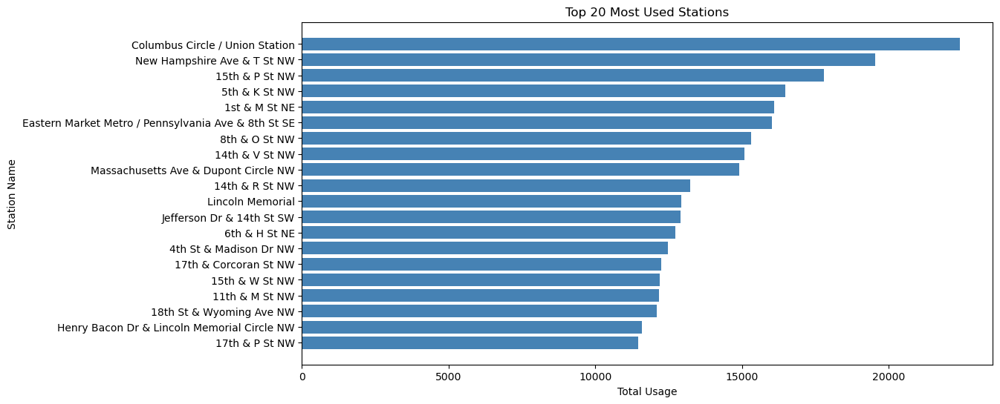

In [42]:
import matplotlib.pyplot as plt

# Plot top 20 most-used stations
top_n = 20  # Change this for more/less stations
top_stations = station_usage.head(top_n)

plt.figure(figsize=(12, 6))
plt.barh(top_stations.index, top_stations['total_usage'], color='steelblue')

# Labeling
plt.xlabel('Total Usage')
plt.ylabel('Station Name')
plt.title(f'Top {top_n} Most Used Stations')
plt.gca().invert_yaxis()  # Most-used station at the top

plt.show()


In [43]:
# Compute total number of rides in the dataset
total_rides = len(fdf_gdf)

# Normalize by total rides
station_usage['usage_percentage'] = (station_usage['total_usage'] / total_rides) * 100

# Display top stations by percentage
print(station_usage[['total_usage', 'usage_percentage']].head(10))


                                                    total_usage  \
Columbus Circle / Union Station                         22426.0   
New Hampshire Ave & T St NW                             19539.0   
15th & P St NW                                          17777.0   
5th & K St NW                                           16475.0   
1st & M St NE                                           16092.0   
Eastern Market Metro / Pennsylvania Ave & 8th S...      16014.0   
8th & O St NW                                           15306.0   
14th & V St NW                                          15069.0   
Massachusetts Ave & Dupont Circle NW                    14903.0   
14th & R St NW                                          13244.0   

                                                    usage_percentage  
Columbus Circle / Union Station                             2.670452  
New Hampshire Ave & T St NW                                 2.326672  
15th & P St NW                                   

In [44]:
# Group by ward to get total ride count per ward
ward_usage = stations_sorted.groupby('ward')['ride_count'].sum().reset_index()

# Sort the result by total ride count to identify the wards with the most traffic
ward_usage = ward_usage.sort_values(by='ride_count', ascending=False)

# Display the total ride count by ward
print(ward_usage)



   ward  ride_count
0     2      709500
1     7       22924


In [45]:
# # Calculate total rides across all wards
# total_rides = stations_sorted['ride_count'].sum()

# # Add a new column to get the percentage of rides per ward
# ward_usage['usage_percentage'] = (ward_usage['ride_count'] / total_rides) * 100

# # Display the ward usage with percentages
# print(ward_usage)


In [46]:
import pandas as pd

# Assuming 'stations_sorted' contains the mapping of station names to wards
# and 'station_usage' contains the usage counts for each station

# Filter for stations in Ward 2 and Ward 7
ward_stations = stations_sorted[stations_sorted['ward'].isin([2, 7])]

# Merge station_usage with ward_stations to include the Ward column
station_usage_ward_2_7 = pd.merge(station_usage, ward_stations[['station_name', 'ward']], 
                                left_index=True, right_on='station_name', how='inner')

# Calculate total rides in the dataset for normalization
total_rides = station_usage['total_usage'].sum()

# Compute usage percentage for each station in Ward 2 and 7
station_usage_ward_2_7['usage_percentage'] = (station_usage_ward_2_7['total_usage'] / total_rides) * 100

# Sort by usage percentage (optional)
station_usage_ward_2_7_sorted = station_usage_ward_2_7.sort_values(by='usage_percentage', ascending=False)

# Display top stations in Ward 2 and Ward 7 with usage percentage
print(station_usage_ward_2_7_sorted[['station_name', 'ward', 'usage_percentage']].tail(20))


                                    station_name  ward  usage_percentage
36786                44th St & New Mexico Ave NW     2          0.005001
59923                          Stanton Square SE     7          0.004763
46275                            Fairfax Village     7          0.003870
37996                             6035 Warehouse     2          0.003632
49457                  Livingston Rd & 3rd St SE     7          0.003572
52330      Mississippi Ave & 19th St SE / THEARC     2          0.003513
46299                    Fort Stanton Rec Center     7          0.003334
63258                      Woody Ward Rec Center     7          0.003156
36779  41st St & Alabama Ave SE / Fort Davis Rec     7          0.002977
35431                           37th & Ely Pl SE     7          0.002858
37997                      61st St & Banks Pl NE     7          0.002798
50146                  MLK & Marion Barry Ave SE     7          0.002560
56132              New Mexico & Cathedral Ave NW   

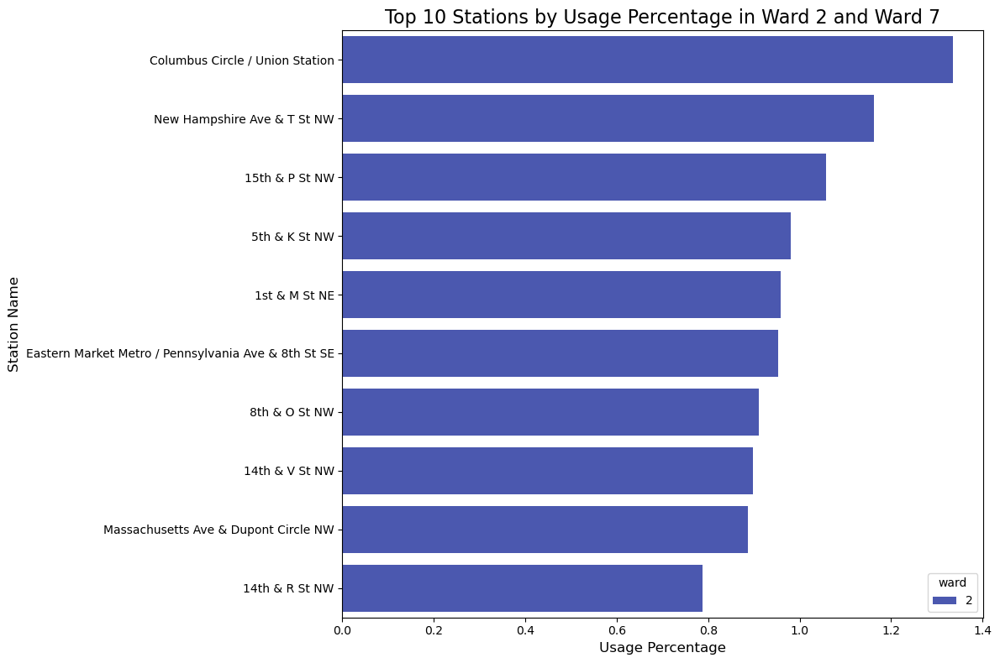

In [47]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming station_usage_ward_2_7_sorted is the DataFrame with the station names, wards, and usage percentages
# Plotting the top 10 stations by usage percentage
plt.figure(figsize=(12, 8))

# Create a bar plot for usage percentages by station
sns.barplot(x='usage_percentage', y='station_name', hue='ward', data=station_usage_ward_2_7_sorted.head(10), palette='coolwarm')

# Add labels and title
plt.xlabel('Usage Percentage', fontsize=12)
plt.ylabel('Station Name', fontsize=12)
plt.title('Top 10 Stations by Usage Percentage in Ward 2 and Ward 7', fontsize=16)

# Show the plot
plt.tight_layout()
plt.show()


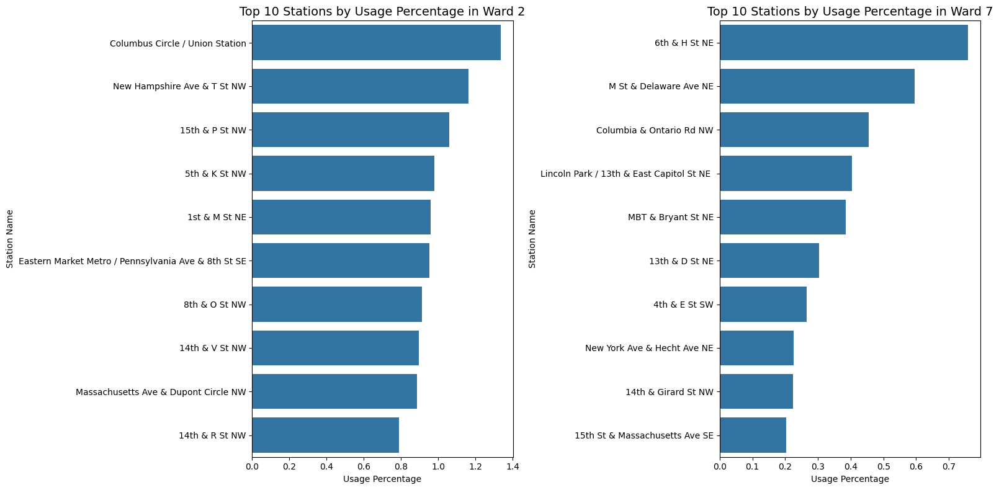

In [48]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filter the DataFrame for Ward 2 and Ward 7
ward_2_usage = station_usage_ward_2_7_sorted[station_usage_ward_2_7_sorted['ward'] == 2].head(10)
ward_7_usage = station_usage_ward_2_7_sorted[station_usage_ward_2_7_sorted['ward'] == 7].head(10)

# Create the subplots (1 row, 2 columns)
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Plot for Ward 2
sns.barplot(x='usage_percentage', y='station_name', data=ward_2_usage, ax=axes[0])
axes[0].set_title('Top 10 Stations by Usage Percentage in Ward 2', fontsize=14)
axes[0].set_xlabel('Usage Percentage')
axes[0].set_ylabel('Station Name')

# Plot for Ward 7
sns.barplot(x='usage_percentage', y='station_name', data=ward_7_usage, ax=axes[1])
axes[1].set_title('Top 10 Stations by Usage Percentage in Ward 7', fontsize=14)
axes[1].set_xlabel('Usage Percentage')
axes[1].set_ylabel('Station Name')

# Adjust layout
plt.tight_layout()
plt.show()


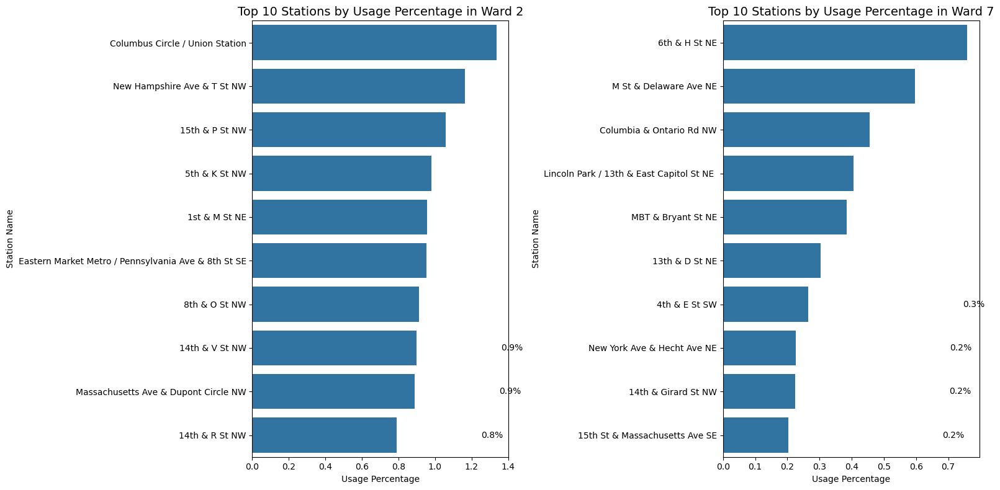

In [49]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filter the DataFrame for Ward 2 and Ward 7
ward_2_usage = station_usage_ward_2_7_sorted[station_usage_ward_2_7_sorted['ward'] == 2].head(10)
ward_7_usage = station_usage_ward_2_7_sorted[station_usage_ward_2_7_sorted['ward'] == 7].head(10)

# Create the subplots (1 row, 2 columns)
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Plot for Ward 2
sns.barplot(x='usage_percentage', y='station_name', data=ward_2_usage, ax=axes[0])
axes[0].set_title('Top 10 Stations by Usage Percentage in Ward 2', fontsize=14)
axes[0].set_xlabel('Usage Percentage')
axes[0].set_ylabel('Station Name')

# Add percentage labels to each bar in Ward 2
for p in axes[0].patches:
    axes[0].annotate(f'{p.get_width():.1f}%', 
                     (p.get_width() + 0.5, p.get_y() + p.get_height() / 2),
                     xytext=(5, 0), textcoords='offset points', ha='center', va='center')

# Plot for Ward 7
sns.barplot(x='usage_percentage', y='station_name', data=ward_7_usage, ax=axes[1])
axes[1].set_title('Top 10 Stations by Usage Percentage in Ward 7', fontsize=14)
axes[1].set_xlabel('Usage Percentage')
axes[1].set_ylabel('Station Name')

# Add percentage labels to each bar in Ward 7
for p in axes[1].patches:
    axes[1].annotate(f'{p.get_width():.1f}%', 
                     (p.get_width() + 0.5, p.get_y() + p.get_height() / 2),
                     xytext=(5, 0), textcoords='offset points', ha='center', va='center')

# Adjust layout
plt.tight_layout()
plt.show()



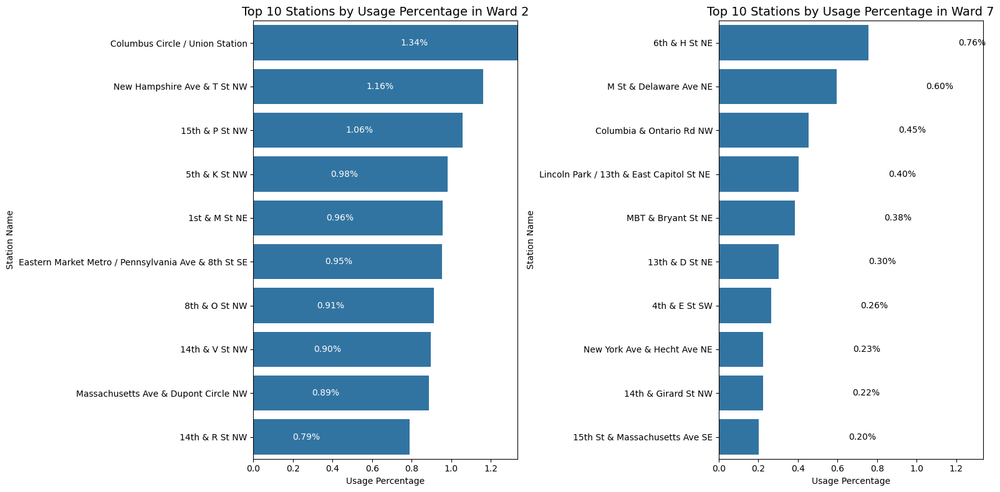

In [50]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filter the DataFrame for Ward 2 and Ward 7
ward_2_usage = station_usage_ward_2_7_sorted[station_usage_ward_2_7_sorted['ward'] == 2].head(10)
ward_7_usage = station_usage_ward_2_7_sorted[station_usage_ward_2_7_sorted['ward'] == 7].head(10)

# Find the maximum usage percentage between both wards for consistent x-axis scale
max_usage = max(ward_2_usage['usage_percentage'].max(), ward_7_usage['usage_percentage'].max())

# Create the subplots (1 row, 2 columns)
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Plot for Ward 2
sns.barplot(x='usage_percentage', y='station_name', data=ward_2_usage, ax=axes[0])
axes[0].set_title('Top 10 Stations by Usage Percentage in Ward 2', fontsize=14)
axes[0].set_xlabel('Usage Percentage')
axes[0].set_ylabel('Station Name')
axes[0].set_xlim(0, max_usage)  # Set fixed x-axis range for better comparison

# Add percentage labels to each bar in Ward 2
for p in axes[0].patches:
    width = p.get_width()
    # Adjust the position to be inside the bars, and make sure small values are readable
    axes[0].annotate(f'{width:.2f}%', 
                    (width - 0.5, p.get_y() + p.get_height() / 2),
                    xytext=(-5, 0), textcoords='offset points', ha='center', va='center', color='white')

# Plot for Ward 7
sns.barplot(x='usage_percentage', y='station_name', data=ward_7_usage, ax=axes[1])
axes[1].set_title('Top 10 Stations by Usage Percentage in Ward 7', fontsize=14)
axes[1].set_xlabel('Usage Percentage')
axes[1].set_ylabel('Station Name')
axes[1].set_xlim(0, max_usage)  # Set fixed x-axis range for better comparison

# Add percentage labels to each bar in Ward 7
for p in axes[1].patches:
    width = p.get_width()
    # Adjust the position to be inside the bars, and make sure small values are readable
    axes[1].annotate(f'{width:.2f}%', 
                    (width + 0.5, p.get_y() + p.get_height() / 2),
                    xytext=(5, 0), textcoords='offset points', ha='center', va='center')

# Adjust layout with increased spacing between subplots
plt.subplots_adjust(wspace=0.8)

plt.tight_layout()
plt.show()


In [51]:
wards_gdf.head()

,WARD,NAME,REP_NAME,WEB_URL,REP_PHONE,REP_EMAIL,REP_OFFICE,WARD_ID,LABEL,STUSAB,SUMLEV,GEOID,GEOCODE,STATE,OBJECTID,GLOBALID,CREATED_DATE,LAST_EDITED_DATE,SHAPEAREA,SHAPELEN,geometry
0,8,Ward 8,"Trayon White, Sr.",https://www.dccouncil.us/council/councilmember...,(202) 724-8045,twhite@dccouncil.us,"1350 Pennsylvania Ave, Suite 400, NW 20004",8,Ward 8,DC,610,610U600US11008,11008,11,1,{E31550AE-6FAE-4B74-909F-52B283BFAF68},None,NaT,0,0,"POLYGON ((-76.99392 38.87771, -77.00336 38.880..."
1,6,Ward 6,Charles Allen,https://www.dccouncil.us/council/councilmember...,(202) 724-8072,callen@dccouncil.us,"1350 Pennsylvania Ave, Suite 110, NW 20004",6,Ward 6,DC,610,610U600US11006,11006,11,2,{765C4F49-9292-4BDB-AA24-39F4EE43359F},None,2023-12-08 01:08:04+00:00,0,0,"POLYGON ((-77.00908 38.87162, -77.00908 38.871..."
2,7,Ward 7,Wendell Felder,https://dccouncil.us/council/vincent-gray,(202) 724-8068,vgray@dccouncil.us,"1350 Pennsylvania Ave, Suite 406, NW 20004",7,Ward 7,DC,610,610U600US11007,11007,11,3,{73F07042-7D7F-452B-9BB3-0F87B0EC5418},None,2025-01-13 23:24:46+00:00,0,0,"POLYGON ((-76.94186 38.91854, -76.942 38.91842..."
3,2,Ward 2,Brooke Pinto,https://www.dccouncil.us/council/ward-2-counci...,(202) 724-8058,bpinto@dccouncil.us,"1350 Pennsylvania Ave, Suite 106, NW 20004",2,Ward 2,DC,610,610U600US11002,11002,11,4,{7F8C2A51-427C-45FC-91EB-9693656AED9C},None,NaT,0,0,"POLYGON ((-77.0327 38.88262, -77.03236 38.8831..."
4,1,Ward 1,Brianne Nadeau,https://dccouncil.us/council/brianne-nadeau,(202) 724-8181,bnadeau@dccouncil.us,"1350 Pennsylvania Ave, Suite 108, NW 20004",1,Ward 1,DC,610,610U600US11001,11001,11,5,{C3C6E2E7-E68D-49B2-970C-D60675EA7B4B},None,2023-12-08 01:08:04+00:00,0,0,"POLYGON ((-77.03523 38.93743, -77.0357 38.9374..."


In [ ]:
fdf_gdf.head()

### Station density by Ward (new try - clean code)

In [53]:
import pandas as pd
import geopandas as gpd

# Step 1: Calculate unique stations per ward
# Ensure 'start_ward' and 'end_ward' are of the same type as 'WARD' (we'll use strings here)
fdf_gdf['start_ward'] = fdf_gdf['start_ward'].astype(str)
fdf_gdf['end_ward'] = fdf_gdf['end_ward'].astype(str)

# For start and end stations
start_station_counts = fdf_gdf.groupby('start_ward')['start_station_name'].nunique()
end_station_counts = fdf_gdf.groupby('end_ward')['end_station_name'].nunique()

# Combine the counts into a single DataFrame
station_counts = pd.DataFrame({
    'start_station_count': start_station_counts,
    'end_station_count': end_station_counts
}).fillna(0)  # Fill NaN with 0, in case there are wards with no stations

# Sum the start and end station counts for total unique stations per ward
station_counts['total_station_count'] = station_counts['start_station_count'] + station_counts['end_station_count']

# Step 2: Merge with the ward area information
# Ensure the GeoDataFrame has a projected CRS for accurate area calculations
if not wards_gdf.crs.is_projected:
    wards_gdf = wards_gdf.to_crs(epsg=3857)  # Convert to a projected CRS (e.g., EPSG:3857)

# Calculate the area of each ward in square meters and add it as a new column
wards_gdf['area'] = wards_gdf.geometry.area

# Ensure WARD is of type string
wards_gdf['WARD'] = wards_gdf['WARD'].astype(str)

# Merge the ward area information with station counts
ward_density = wards_gdf[['WARD', 'area']].merge(station_counts, left_on='WARD', right_index=True, how='left')

# Step 3: Calculate station density (stations per square kilometer)
ward_density['station_density'] = ward_density['total_station_count'] / (ward_density['area'] / 10**6)  # Convert area from m² to km²

# Step 4: Display the result
print(ward_density[['WARD', 'station_density']])



  WARD  station_density
0    8         1.478942
1    6         5.941901
2    7         1.789887
3    2         8.762863
4    1        11.768863
5    5         2.692905
6    3         1.578608
7    4         2.537594


In [54]:
ward_density

,WARD,area,start_station_count,end_station_count,total_station_count,station_density
0,8,5.341655e+07,44,35,79,1.478942
1,6,2.911526e+07,100,73,173,5.941901
2,7,3.966730e+07,39,32,71,1.789887
3,2,3.035538e+07,157,109,266,8.762863
4,1,1.087616e+07,88,40,128,11.768863
5,5,4.456155e+07,74,46,120,2.692905
6,3,4.687675e+07,42,32,74,1.578608
7,4,3.861927e+07,74,24,98,2.537594


In [55]:
# Calculate the station density for each ward
import pandas as pd
import geopandas as gpd

# Step 1: Calculate unique stations per ward
# Ensure 'start_ward' and 'end_ward' are of the same type as 'WARD' (we'll use strings here)
fdf_gdf['start_ward'] = fdf_gdf['start_ward'].astype(str)
fdf_gdf['end_ward'] = fdf_gdf['end_ward'].astype(str)

# For unique stations, we first combine both start and end stations
unique_start_stations = fdf_gdf[['start_ward', 'start_station_name']].drop_duplicates()
unique_end_stations = fdf_gdf[['end_ward', 'end_station_name']].drop_duplicates()

# Now count the unique stations for each ward (start and end combined)
start_station_counts = unique_start_stations.groupby('start_ward')['start_station_name'].nunique()
end_station_counts = unique_end_stations.groupby('end_ward')['end_station_name'].nunique()

# Combine the counts into a single DataFrame
station_counts = pd.DataFrame({
    'start_station_count': start_station_counts,
    'end_station_count': end_station_counts
}).fillna(0)  # Fill NaN with 0, in case there are wards with no stations

# Sum the start and end station counts for total unique stations per ward
station_counts['total_station_count'] = station_counts['start_station_count'] + station_counts['end_station_count']

# Step 2: Merge with the ward area information
wards_gdf['WARD'] = wards_gdf['WARD'].astype(str)  # Ensure WARD is of type string
ward_density = wards_gdf[['WARD', 'area']].merge(station_counts, left_on='WARD', right_index=True, how='left')

# Step 3: Calculate station density (stations per square kilometer)
ward_density['station_density'] = ward_density['total_station_count'] / (ward_density['area'] / 10**6)  # Convert area from m² to km²

# Step 4: Display the result
print(ward_density[['WARD', 'station_density']])


  WARD  station_density
0    8         1.478942
1    6         5.941901
2    7         1.789887
3    2         8.762863
4    1        11.768863
5    5         2.692905
6    3         1.578608
7    4         2.537594


In [56]:
wards_gdf

,WARD,NAME,REP_NAME,WEB_URL,REP_PHONE,REP_EMAIL,REP_OFFICE,WARD_ID,LABEL,STUSAB,SUMLEV,GEOID,GEOCODE,STATE,OBJECTID,GLOBALID,CREATED_DATE,LAST_EDITED_DATE,SHAPEAREA,SHAPELEN,geometry,area
0,8,Ward 8,"Trayon White, Sr.",https://www.dccouncil.us/council/councilmember...,(202) 724-8045,twhite@dccouncil.us,"1350 Pennsylvania Ave, Suite 400, NW 20004",8,Ward 8,DC,610,610U600US11008,11008,11,1,{E31550AE-6FAE-4B74-909F-52B283BFAF68},None,NaT,0,0,"POLYGON ((-8570923.563 4704169.383, -8571974.4...",5.341655e+07
1,6,Ward 6,Charles Allen,https://www.dccouncil.us/council/councilmember...,(202) 724-8072,callen@dccouncil.us,"1350 Pennsylvania Ave, Suite 110, NW 20004",6,Ward 6,DC,610,610U600US11006,11006,11,2,{765C4F49-9292-4BDB-AA24-39F4EE43359F},None,2023-12-08 01:08:04+00:00,0,0,"POLYGON ((-8572611.993 4703299.179, -8572611.9...",2.911526e+07
2,7,Ward 7,Wendell Felder,https://dccouncil.us/council/vincent-gray,(202) 724-8068,vgray@dccouncil.us,"1350 Pennsylvania Ave, Suite 406, NW 20004",7,Ward 7,DC,610,610U600US11007,11007,11,3,{73F07042-7D7F-452B-9BB3-0F87B0EC5418},None,2025-01-13 23:24:46+00:00,0,0,"POLYGON ((-8565128.878 4710010.273, -8565144.4...",3.966730e+07
3,2,Ward 2,Brooke Pinto,https://www.dccouncil.us/council/ward-2-counci...,(202) 724-8058,bpinto@dccouncil.us,"1350 Pennsylvania Ave, Suite 106, NW 20004",2,Ward 2,DC,610,610U600US11002,11002,11,4,{7F8C2A51-427C-45FC-91EB-9693656AED9C},None,NaT,0,0,"POLYGON ((-8575241.462 4704871.527, -8575203.3...",3.035538e+07
4,1,Ward 1,Brianne Nadeau,https://dccouncil.us/council/brianne-nadeau,(202) 724-8181,bnadeau@dccouncil.us,"1350 Pennsylvania Ave, Suite 108, NW 20004",1,Ward 1,DC,610,610U600US11001,11001,11,5,{C3C6E2E7-E68D-49B2-970C-D60675EA7B4B},None,2023-12-08 01:08:04+00:00,0,0,"POLYGON ((-8575522.893 4712713.561, -8575574.5...",1.087616e+07
5,5,Ward 5,Zachary Parker,https://dccouncil.us/council/kenyan-mcduffie,(202) 724-8028,zparker@dccouncil.gov,"1350 Pennsylvania Ave, Suite 102, NW 20004",5,Ward 5,DC,610,610U600US11005,11005,11,6,{6C10DD95-DE70-4F26-94BA-79F378FA74E0},None,2023-12-08 01:08:04+00:00,0,0,"POLYGON ((-8570647.344 4715557.514, -8570668.8...",4.456155e+07
6,3,Ward 3,Matthew Frumin,https://www.dccouncil.us/council/council-membe...,(202) 724-8062,mfrumin@dccouncil.gov,"1350 Pennsylvania Ave, Suite 408, NW 20004",3,Ward 3,DC,610,610U600US11003,11003,11,7,{1185DA9F-91FF-43F8-B7B8-02C8B8F18770},None,2023-12-08 01:08:04+00:00,0,0,"POLYGON ((-8578066.424 4715479.621, -8578067.0...",4.687675e+07
7,4,Ward 4,Janeese Lewis George,https://dccouncil.us/council/ward-4-councilmem...,(202) 724-8052,jlewisgeorge@dccouncil.us,"1350 Pennsylvania Ave, Suite 105, NW 20004",4,Ward 4,DC,610,610U600US11004,11004,11,8,{AEF97B21-5F96-49F6-8C58-0D41FF95B471},None,NaT,0,0,"POLYGON ((-8576161.16 4721094.045, -8579586.84...",3.861927e+07


In [58]:
# Ensure the GeoDataFrame has a projected CRS for accurate area calculations
if not wards_gdf.crs.is_projected:
	wards_gdf = wards_gdf.to_crs(epsg=3857)  # Convert to a projected CRS (e.g., EPSG:3857)

# Calculate the area of each ward in square kilometers
wards_gdf['area_km2'] = wards_gdf.geometry.area / 10**6  # Convert from m² to km²

# Display the area of each ward in km²
wards_gdf[['WARD', 'area_km2']].sort_values(by='WARD', ascending=True)

,WARD,area_km2
4,1,10.876157
3,2,30.355376
6,3,46.876755
7,4,38.619265
5,5,44.561548
1,6,29.115261
2,7,39.667300
0,8,53.416555


In [59]:
# Group by start_ward and count unique start_station_name
unique_stations_by_ward = fdf_gdf.groupby('start_ward')['start_station_name'].nunique()

# Display the result
unique_stations_by_ward.reset_index(name='station_count')[['start_ward', 'station_count']]

,start_ward,station_count
0,1,88
1,2,157
2,3,42
3,4,74
4,5,74
5,6,100
6,7,39
7,8,44


In [60]:
# Calculate unique station counts per ward
unique_station_counts = fdf_gdf.groupby('start_ward')['start_station_name'].nunique().reset_index()
unique_station_counts.columns = ['WARD', 'unique_stations_by_ward']

# Ensure both WARD columns have the same data type
wards_gdf['WARD'] = wards_gdf['WARD'].astype(int)
unique_station_counts['WARD'] = unique_station_counts['WARD'].astype(int)

# Merge with ward area data
ward_density_unique = wards_gdf[['WARD', 'area_km2']].merge(unique_station_counts, on='WARD', how='left')

# Calculate station density (stations per km²)
ward_density_unique['station_density'] = ward_density_unique['unique_stations_by_ward'] / ward_density_unique['area_km2']

# Display the result
print(ward_density_unique[['WARD', 'station_density']].sort_values(by='WARD', ascending=True))

   WARD  station_density
4     1         8.091093
3     2         5.172066
6     3         0.895966
7     4         1.916142
5     5         1.660625
1     6         3.434625
2     7         0.983178
0     8         0.823715


In [63]:
import folium
from folium import Choropleth

# Convert all datetime columns in wards_gdf to strings to avoid JSON serialization issues
for col in wards_gdf.select_dtypes(include=["datetime64[ns, UTC]", "datetime64[ns]"]).columns:
    wards_gdf[col] = wards_gdf[col].dt.strftime('%Y-%m-%d %H:%M:%S')

# Initialize the map centered on Washington, DC
m = folium.Map(location=[38.9072, -77.0369], zoom_start=11)

# Create a choropleth map
folium.Choropleth(
    geo_data=wards_gdf,  # GeoJSON geometry data
    name="Station Density by Ward",  # Map title
    data=ward_density_unique,  # Data to visualize (station density)
    columns=["WARD", "station_density"],  # Columns with the data (WARD and station density)
    key_on="feature.properties.WARD",  # Key in the GeoJSON file to match the "WARD" column
    fill_color="YlGnBu",  # Color scheme
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Station Density (stations/km²)",  # Legend title
).add_to(m)

# Add Ward boundaries to the map
folium.GeoJson(
    wards_gdf,
    name="Ward Boundaries",
    style_function=lambda feature: {
        "fillColor": "transparent",
        "color": "black",
        "weight": 1,
        "dashArray": "5, 5",
    },
    tooltip=folium.GeoJsonTooltip(fields=["WARD"], aliases=["Ward:"]),
).add_to(m)

# Add layer control
folium.LayerControl().add_to(m)

# Save the map to an HTML file
m.save("station_density_by_ward_map.html")

# Display the map (if using Jupyter Notebook)
m

In [64]:
import pandas as pd

# Ensure all datetime columns are converted to string
for col in wards_gdf.columns:
    if isinstance(wards_gdf[col].dtype, pd.DatetimeTZDtype) or wards_gdf[col].dtype == "datetime64[ns]":
        wards_gdf[col] = wards_gdf[col].astype(str)

# If the issue persists, drop all datetime columns as a fallback
wards_gdf = wards_gdf.drop(columns=wards_gdf.select_dtypes(include=["datetime64[ns]"]).columns, errors="ignore")


In [65]:
# Check for any remaining Timestamp objects
for col in wards_gdf.columns:
    if wards_gdf[col].apply(lambda x: isinstance(x, pd.Timestamp)).any():
        print(f"Column '{col}' still contains Timestamps!")


In [66]:
wards_gdf[col] = wards_gdf[col].astype(str)


In [67]:
# Station density by Ward   
import folium
from folium import Choropleth

# Convert all Timestamp columns in wards_gdf to strings to avoid JSON serialization issues
for col in wards_gdf.select_dtypes(include=["datetime64[ns]"]).columns:
    wards_gdf[col] = wards_gdf[col].astype(str)

# Initialize the map centered on Washington, DC
m = folium.Map(location=[38.9072, -77.0369], zoom_start=11)

# Create a choropleth map
folium.Choropleth(
    geo_data=wards_gdf,  # GeoJSON geometry data
    name="Station Density by Ward",  # Map title
    data=ward_density_unique,  # Data to visualize (station density)
    columns=["WARD", "station_density"],  # Columns with the data (WARD and station density)
    key_on="feature.properties.WARD",  # Key in the GeoJSON file to match the "WARD" column
    fill_color="YlOrRd",  # More vibrant color scale
    bins=8,  # More b
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Station Density (stations/km²)",  # Legend title
).add_to(m)

# Add Ward boundaries to the map
folium.GeoJson(
    wards_gdf,
    name="Ward Boundaries",
    style_function=lambda feature: {
        "fillColor": "transparent",
        "color": "black",
        "weight": 1,
        "dashArray": "5, 5",
    },
    tooltip=folium.GeoJsonTooltip(fields=["WARD"], aliases=["Ward:"]),
).add_to(m)

# Add layer control
folium.LayerControl().add_to(m)

# Save the map to an HTML file
m.save("station_density_by_ward_map.html")

# Display the map (if using Jupyter Notebook)
m

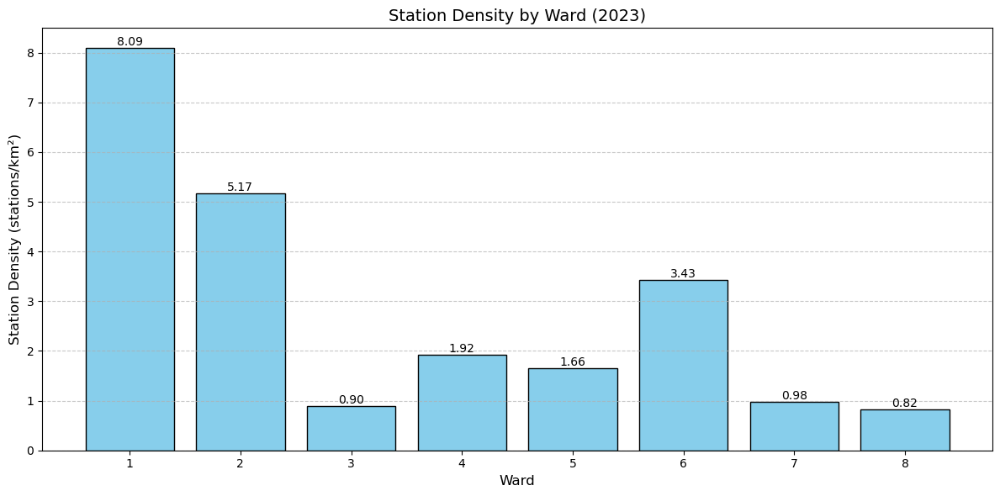

In [68]:
import matplotlib.pyplot as plt

# Assuming ward_density_unique is the dataframe with 'WARD' and 'station_density' columns
station_density_by_ward = ward_density_unique[['WARD', 'station_density']]

# Sort the dataframe by the 'WARD' column
station_density_by_ward = station_density_by_ward.sort_values(by='WARD')

# Creating a figure with a larger size
plt.figure(figsize=(12, 6))

# Plotting the bar chart
bars = plt.bar(station_density_by_ward['WARD'], station_density_by_ward['station_density'], color='skyblue', edgecolor='black')

# Adding data labels on top of the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, f'{yval:.2f}', va='bottom', ha='center', fontsize=10)

# Adding labels and title
plt.xlabel('Ward', fontsize=12)
plt.ylabel('Station Density (stations/km²)', fontsize=12)
plt.title('Station Density by Ward (2023)', fontsize=14)

# Adding gridlines for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Display the plot
plt.tight_layout()  # To ensure everything fits without overlap
plt.show()

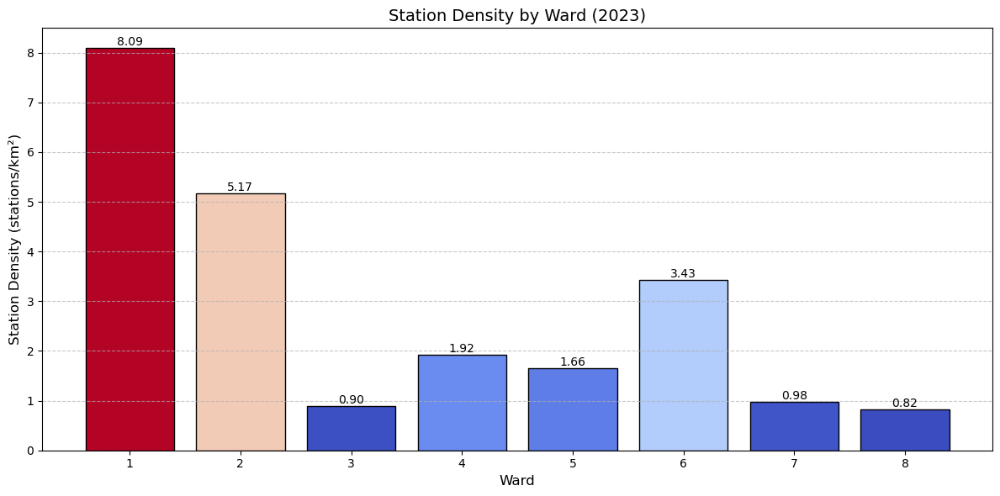

In [69]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Assuming ward_density_unique is the dataframe with 'WARD' and 'station_density' columns
station_density_by_ward = ward_density_unique[['WARD', 'station_density']]

# Sort the dataframe by the 'WARD' column
station_density_by_ward = station_density_by_ward.sort_values(by='WARD')

# Normalize station density values for colormap mapping
norm = plt.Normalize(station_density_by_ward['station_density'].min(), station_density_by_ward['station_density'].max())
colors = sns.color_palette('coolwarm', as_cmap=True)(norm(station_density_by_ward['station_density'].values))

# Creating a figure with a larger size
plt.figure(figsize=(12, 6))

# Plotting the bar chart with coolwarm colors
bars = plt.bar(station_density_by_ward['WARD'], station_density_by_ward['station_density'], color=colors, edgecolor='black')

# Adding data labels on top of the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, f'{yval:.2f}', va='bottom', ha='center', fontsize=10)

# Adding labels and title
plt.xlabel('Ward', fontsize=12)
plt.ylabel('Station Density (stations/km²)', fontsize=12)
plt.title('Station Density by Ward (2023)', fontsize=14)

# Adding gridlines for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Display the plot
plt.tight_layout()  # To ensure everything fits without overlap
plt.show()


In [ ]:
# # PLot station density by ward - wrong code
# import matplotlib.pyplot as plt

# # Assuming ward_density is the dataframe with 'WARD' and 'station_density' columns
# station_density_by_ward = ward_density[['WARD', 'station_density']]

# # Sort the dataframe by the 'WARD' column
# station_density_by_ward = station_density_by_ward.sort_values(by='WARD')

# # Creating a figure with a larger size
# plt.figure(figsize=(12, 6))

# # Plotting the bar chart
# bars = plt.bar(station_density_by_ward['WARD'], station_density_by_ward['station_density'], color='skyblue', edgecolor='black')

# # Adding data labels on top of the bars
# for bar in bars:
#     yval = bar.get_height()
#     plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), va='bottom', ha='center', fontsize=10)

# # Adding labels and title
# plt.xlabel('Ward', fontsize=12)
# plt.ylabel('Station Density (stations/km²)', fontsize=12)
# plt.title('Station Density by Ward in Washington DC (2023)', fontsize=14)

# # Adding gridlines for better readability
# plt.grid(axis='y', linestyle='--', alpha=0.7)

# # Display the plot
# plt.tight_layout()  # To ensure everything fits without overlap
# plt.show()


In [73]:
from folium.plugins import Fullscreen

# Create a Folium map centered on Washington, DC with a min_zoom limit
m = folium.Map(
    location=[38.9072, -77.0369], 
    zoom_start=11, 
    tiles=None,  # Disable default tiles to add a customized layer
    control_scale=True
)

# Add a tile layer with a min_zoom restriction
folium.TileLayer(
    'cartodb positron',
    min_zoom=10,  # Set your desired minimum zoom level
    max_zoom=16   # Optional: Set max zoom level
).add_to(m)

# Merge station_density into wards_gdf
wards_gdf = wards_gdf.merge(ward_density_unique[['WARD', 'station_density']], on='WARD', how='left')

# Convert the updated GeoDataFrame to GeoJSON
wards_json = json.loads(wards_gdf.to_json())

# Create a choropleth layer for station density
choropleth = folium.Choropleth(
    geo_data=wards_json,  # GeoJSON geometry data
    name="Station Density by Ward",  # Layer name
    data=ward_density_unique,  # Data to visualize
    columns=["WARD", "station_density"],  # Columns with the data (WARD and station density)
    key_on="feature.properties.WARD",  # Key in the GeoJSON file to match the "WARD" column
    fill_color="YlOrRd",  # Color scale
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Station Density (stations/km²)",  # Legend title
).add_to(m)

folium.GeoJson(
    wards_json,
    name="Wards",
    style_function=lambda feature: {
        "fillColor": "transparent",
        "color": "black",
        "weight": 1,
        "dashArray": "5, 5"
    },
    tooltip=folium.GeoJsonTooltip(fields=["WARD", "station_density"],
                                aliases=["Ward:", "Station Density:"],
                                localize=True,
                                sticky=False)
).add_to(m)

# Add fullscreen control (optional)
Fullscreen(position='topright').add_to(m)

# Add layer control
folium.LayerControl().add_to(m)

# Save and display map
m.save("station_density_map.html")
m

In [74]:
# Foliun map based on wrong code
from folium.plugins import Fullscreen

# Create a Folium map centered on Washington, DC with a min_zoom limit
m = folium.Map(
    location=[38.9072, -77.0369], 
    zoom_start=11, 
    tiles=None,  # Disable default tiles to add a customized layer
    control_scale=True
)

# Add a tile layer with a min_zoom restriction
folium.TileLayer(
    'cartodb positron',
    min_zoom=10,  # Set your desired minimum zoom level
    max_zoom=16   # Optional: Set max zoom level
).add_to(m)

# Add the rest of your layers (Choropleth, Labels, etc.)
choropleth.add_to(m)

folium.GeoJson(
    gdf_wards_json,
    name="Wards",
    style_function=lambda feature: {
        "fillColor": "transparent",
        "color": "black",
        "weight": 1,
        "dashArray": "5, 5"
    },
    tooltip=folium.GeoJsonTooltip(fields=["WARD", "station_density"],
                                aliases=["Ward:", "Station Density:"],
                                localize=True,
                                sticky=False)
).add_to(m)

# Add fullscreen control (optional)
Fullscreen(position='topright').add_to(m)

# Add layer control
folium.LayerControl().add_to(m)

# Save and display map
m.save("station_density_map.html")
m


NameError: name 'gdf_wards_json' is not defined

### Station density by Ward (first try - doesn't work anymore)

In [ ]:
# import geopandas as gpd

# # Step 1: Reproject to a suitable projected CRS (e.g., EPSG:3395)
# wards_gdf = wards_gdf.to_crs(epsg=3395)  # EPSG:3395 is for meters, suitable for global area calculations

# # Step 2: Recalculate the area in square kilometers
# wards_gdf['area_km2'] = wards_gdf.geometry.area / 10**6  # Convert from square meters to square kilometers

# # Step 3: Proceed with your previous calculations for station density
# stations_per_ward = all_stations.groupby('ward')['station_name'].nunique()

# ward_density = wards_gdf[['WARD', 'area_km2']].merge(stations_per_ward, left_on='WARD', right_index=True, how='left')
# ward_density['station_density'] = ward_density['station_name'] / ward_density['area_km2']

# # Step 4: Display the result
# print(ward_density[['WARD', 'station_density']])


In [ ]:
# import matplotlib.pyplot as plt

# # Assuming ward_density is the dataframe with 'WARD' and 'station_density' columns
# station_density_by_ward = ward_density[['WARD', 'station_density']]

# # Sort the dataframe by the 'WARD' column
# station_density_by_ward = station_density_by_ward.sort_values(by='WARD')

# # Creating a figure with a larger size
# plt.figure(figsize=(12, 6))

# # Plotting the bar chart
# bars = plt.bar(station_density_by_ward['WARD'], station_density_by_ward['station_density'], color='skyblue', edgecolor='black')

# # Adding data labels on top of the bars
# for bar in bars:
#     yval = bar.get_height()
#     plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), va='bottom', ha='center', fontsize=10)

# # Adding labels and title
# plt.xlabel('Ward', fontsize=12)
# plt.ylabel('Station Density (stations/km²)', fontsize=12)
# plt.title('Station Density by Ward in Washington DC', fontsize=14)

# # Adding gridlines for better readability
# plt.grid(axis='y', linestyle='--', alpha=0.7)

# # Display the plot
# plt.tight_layout()  # To ensure everything fits without overlap
# plt.show()


In [ ]:
wards_gdf = wards_gdf.to_crs("EPSG:4326")


In [ ]:
import folium
from folium import Choropleth

# Initialize the map centered on Washington, DC
m = folium.Map(location=[38.907, -77.0366], zoom_start=12)

# Create a choropleth map
folium.Choropleth(
    geo_data=wards_gdf,  # GeoJSON geometry data
    name="Station Density by Ward",  # Map title
    data=wards_gdf,  # Data to visualize (station density)
    columns=["WARD", "station_density"],  # Column with the data (station density)
    key_on="feature.properties.WARD",  # Key in the GeoJSON file to match the "WARD" column
    fill_color="YlGnBu",  # Color scheme
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Station Density (stations/km²)",  # Legend title
).add_to(m)

# Add Ward boundaries to the map (optional)
folium.GeoJson(wards_gdf.geometry).add_to(m)

# Add labels for each Ward (using centroid for label placement)
for _, row in wards_gdf.iterrows():
    # Get the centroid of the ward geometry
    centroid = row['geometry'].centroid
    # Add a marker with the ward name at the centroid
    folium.Marker(
        location=[centroid.y, centroid.x],
        popup=f"Ward {row['WARD']}",  # Display ward number on click
        icon=folium.Icon(icon='cloud', color='blue')  # Optional: Change marker style
    ).add_to(m)

# Display the map in Jupyter (if using Jupyter notebooks)
m


### Bike lane density by Ward

In [ ]:
pip install geopandas


In [ ]:
# Load the wards GeoJSON file
import geopandas as gpd

bike_lanes = gpd.read_file(r"C:\Users\raclo\Documents\Bootcamp\Project 3\DC Extra files\bicycle_lanes_dc.geojson")

In [ ]:
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point

# Convert fdf_gdf to GeoDataFrame using start station coordinates
fdf_gdf["geometry"] = fdf_gdf.apply(lambda row: Point(row["start_lng"], row["start_lat"]), axis=1)
fdf_gdf = gpd.GeoDataFrame(fdf_gdf, geometry="geometry", crs="EPSG:4326")  # Ensure WGS84 projection


In [ ]:
fdf_gdf = fdf_gdf.dropna(subset=["geometry"])


In [ ]:
def find_nearest_bike_lane(station_point):
    """Finds the nearest bike lane for a given station using spatial indexing."""
    if not isinstance(station_point, Point):
        print(f"Invalid geometry: {station_point}")
        return None  # Skip invalid geometries

    possible_matches_index = list(bike_lanes_sindex.nearest(station_point.bounds, 1))  # Get nearest candidate
    nearest_lane = bike_lanes_gdf.iloc[possible_matches_index[0]]
    return nearest_lane


In [ ]:
print(fdf_gdf.crs)  # Should be EPSG:4326
print(bike_lanes_gdf.crs)  # Should match EPSG:4326


In [ ]:
def find_nearest_bike_lane(station_point):
    """Finds the nearest bike lane for a given station using spatial indexing."""
    if not isinstance(station_point, Point):
        return None  # Ensure only valid Points are processed
    
    possible_matches_index = list(bike_lanes_sindex.nearest(station_point, 1))  # Pass station_point directly
    if possible_matches_index:
        return bike_lanes_gdf.iloc[possible_matches_index[0]]
    return None  # Return None if no match found


In [ ]:
# Ensure the 'geometry' column contains Points
print(fdf_gdf["geometry"].apply(lambda x: isinstance(x, Point)).value_counts())

# Now you can access the 'geometry' column properly
fdf_gdf["longitude"] = fdf_gdf["geometry"].apply(lambda x: x.x if isinstance(x, Point) else None)
fdf_gdf["latitude"] = fdf_gdf["geometry"].apply(lambda x: x.y if isinstance(x, Point) else None)

# Check if the 'longitude' and 'latitude' were correctly extracted
print(fdf_gdf[["longitude", "latitude"]].head())


In [ ]:
import geopandas as gpd

# Load the wards GeoJSON and reproject to a projected CRS (if needed)
wards_gdf = gpd.read_file("wards_from_2022.geojson")
wards_gdf = wards_gdf.to_crs(epsg=3395)  # Reproject to a projected CRS (e.g., EPSG:3395)

# Load bike lanes GeoJSON and reproject to the same CRS as wards
bike_lanes_gdf = gpd.read_file(r"C:\Users\raclo\Documents\Bootcamp\Project 3\DC Extra files\bicycle_lanes_dc.geojson")
bike_lanes_gdf = bike_lanes_gdf.to_crs(epsg=3395)  # Reproject to match the CRS of wards

# Step 2: Count the number of bike lanes in each ward
# Perform a spatial join to associate bike lanes with wards
bike_lanes_with_ward = gpd.sjoin(bike_lanes_gdf, wards_gdf, how="inner", predicate="within")

# Step 3: Calculate the area of each ward (in square meters)
wards_gdf['area'] = wards_gdf.geometry.area

# Step 4: Calculate the bike lane density (per km²)
# First, calculate the bike lane density as the count of bike lanes per ward
bike_lane_density = bike_lanes_with_ward.groupby("WARD").size().reset_index(name="bike_lane_count")

# Merge with wards_gdf to add area information
bike_lane_density = bike_lane_density.merge(wards_gdf[['WARD', 'area']], on="WARD")

# Calculate bike lane density (count per km² or m²)
# Assuming area is in square meters, divide by 1,000,000 to get density per km²
bike_lane_density["density_per_km2"] = bike_lane_density["bike_lane_count"] / (bike_lane_density["area"] / 1e6)

# Step 5: Display the result
print(bike_lane_density)


In [ ]:
import matplotlib.pyplot as plt

# Assuming bike_lane_density is the DataFrame with the bike lane density information
# Plotting the bike lane density by ward
plt.figure(figsize=(12, 6))

# Plotting the bar chart
bars = plt.bar(bike_lane_density['WARD'], bike_lane_density['density_per_km2'], color='skyblue', edgecolor='black')

# Adding data labels on top of the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), va='bottom', ha='center', fontsize=10)

# Adding labels and title
plt.xlabel('Ward', fontsize=12)
plt.ylabel('Bike Lane Density (lanes/km²)', fontsize=12)
plt.title('Bike Lane Density by Ward in Washington DC', fontsize=14)

# Adding gridlines for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Display the plot
plt.tight_layout()  # To ensure everything fits without overlap
plt.show()

In [ ]:
# import matplotlib.pyplot as plt

# # Assuming bike_lane_density is the DataFrame with the bike lane density information
# # Plotting the bike lane density by ward
# plt.figure(figsize=(12, 6))

# # Plotting the bar chart
# bars = plt.bar(bike_lane_density['WARD'], bike_lane_density['density_per_km2'], color='skyblue', edgecolor='black')

# # Adding data labels on top of the bars
# for bar in bars:
#     yval = bar.get_height()
#     plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), va='bottom', ha='center', fontsize=10)

# # Adding labels and title
# plt.xlabel('Ward', fontsize=12)
# plt.ylabel('Bike Lane Density (lanes/km²)', fontsize=12)
# plt.title('Bike Lane Density by Ward in Washington DC', fontsize=14)

# # Adding gridlines for better readability
# plt.grid(axis='y', linestyle='--', alpha=0.7)

# # Display the plot
# plt.tight_layout()  # To ensure everything fits without overlap
# plt.show()

In [ ]:
import matplotlib.pyplot as plt

# Assuming bike_lane_density is the DataFrame with the bike lane density information
# Plotting the bike lane density by ward
plt.figure(figsize=(12, 6))

# Plotting the bar chart
bars = plt.bar(bike_lane_density['WARD'], bike_lane_density['density_per_km2'], color='skyblue', edgecolor='black')

# Adding data labels on top of the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), va='bottom', ha='center', fontsize=10)

# Adding labels and title
plt.xlabel('Ward', fontsize=12)
plt.ylabel('Bike Lane Density (lanes/km²)', fontsize=12)
plt.title('Bike Lane Density by Ward in Washington DC (2023)', fontsize=14)

# Adding gridlines for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Display the plot
plt.tight_layout()  # To ensure everything fits without overlap
plt.show()

### Bike Lane and Station Density 

In [ ]:
bike_lane_density


In [79]:
ward_density

,WARD,area,start_station_count,end_station_count,total_station_count,station_density
0,8,5.341655e+07,44,35,79,1.478942
1,6,2.911526e+07,100,73,173,5.941901
2,7,3.966730e+07,39,32,71,1.789887
3,2,3.035538e+07,157,109,266,8.762863
4,1,1.087616e+07,88,40,128,11.768863
5,5,4.456155e+07,74,46,120,2.692905
6,3,4.687675e+07,42,32,74,1.578608
7,4,3.861927e+07,74,24,98,2.537594


In [80]:
# Convert 'WARD' column to string in both dataframes
bike_lane_density['WARD'] = bike_lane_density['WARD'].astype(str)
ward_density['WARD'] = ward_density['WARD'].astype(str)

# Perform the merge and assign it to density_df
density_df = pd.merge(ward_density, bike_lane_density, on='WARD', how='left')

# Save the merged dataframe to a CSV file
density_df.to_csv('merged_ward_data.csv', index=False)

# Print a confirmation message
print("The merged data has been saved as 'merged_ward_data.csv'.")


NameError: name 'bike_lane_density' is not defined

In [78]:
density_df

NameError: name 'density_df' is not defined

In [ ]:
density_df.rename(columns={"density_per_km2": "bike_lane_density"}, inplace=True)

In [77]:
density_df = density_df.sort_values(by='WARD', ascending=True)

NameError: name 'density_df' is not defined

In [ ]:
density_df

In [76]:
# Step 1: Calculate total ride counts for each ward based on both start and end stations
start_ride_counts = fdf_gdf.groupby('start_ward')['ride_id'].nunique()  # Unique ride counts for start station
end_ride_counts = fdf_gdf.groupby('end_ward')['ride_id'].nunique()      # Unique ride counts for end station

# Combine the start and end ride counts
total_ride_counts = start_ride_counts.add(end_ride_counts, fill_value=0)  # Add the counts from both start and end

# Step 2: Calculate total distance and total ride duration for each ward
total_distance = fdf_gdf.groupby('start_ward')['distance'].sum() + fdf_gdf.groupby('end_ward')['distance'].sum()  # Total distance by adding from start and end
total_ride_duration = fdf_gdf.groupby('start_ward')['ride_duration_min'].sum() + fdf_gdf.groupby('end_ward')['ride_duration_min'].sum()  # Total ride duration

# Step 3: Merge these new calculations into the density_df dataframe
density_df['total_ride_counts'] = density_df['WARD'].map(total_ride_counts)
density_df['total_distance'] = density_df['WARD'].map(total_distance)
density_df['total_ride_duration'] = density_df['WARD'].map(total_ride_duration)



NameError: name 'density_df' is not defined

In [ ]:
density_df.head(10)

In [ ]:
fdf_gdf.head()

In [75]:
import pandas as pd
import folium
from folium.plugins import BeautifyIcon

# Assuming 'fdf_gdf' is your full dataframe
# Filter data for Ward 2 and Ward 7
filtered_df = fdf_gdf[fdf_gdf["start_ward"].isin([2, 7])]

# Group by routes and count occurrences
route_counts = (
    filtered_df.groupby(["start_ward", "end_ward", "start_station_name", "end_station_name", "start_lat", "start_lng", "end_lat", "end_lng"])
    .size()
    .reset_index(name="count")
)

# Get the 10 most common routes for each ward
top_routes = (
    route_counts.groupby("start_ward")
    .apply(lambda x: x.nlargest(10, "count"))
    .reset_index(drop=True)
)

# Create a Folium map centered around Washington, DC with a min zoom level
m = folium.Map(location=[38.9072, -77.0369], zoom_start=12, min_zoom=10, tiles="cartodb positron")

# Define colors for each ward
ward_colors = {2: "blue", 7: "red"}

# Add ward boundaries from the GeoJSON file
# Load the GeoJSON file that contains ward boundaries (assuming the file path is correct)
geojson_path = "wards_from_2022.geojson"  # Update this with the correct path
folium.GeoJson(geojson_path, name="Ward Boundaries", 
               style_function=lambda x: {
                   'fillColor': 'none',
                   'color': 'black',
                   'weight': 1
               }).add_to(m)

# Add routes to the map
for _, row in top_routes.iterrows():
    start_coords = (row["start_lat"], row["start_lng"])
    end_coords = (row["end_lat"], row["end_lng"])
    
    # Add route lines
    folium.PolyLine(
        [start_coords, end_coords],
        color=ward_colors[row["start_ward"]],
        weight=5,
        opacity=0.7,
        tooltip=f"{row['start_station_name']} → {row['end_station_name']} ({row['count']} trips)"
    ).add_to(m)

    # Add markers for start and end stations
    folium.Marker(
        start_coords,
        icon=BeautifyIcon(icon="play", border_color=ward_colors[row["start_ward"]], text_color=ward_colors[row["start_ward"]]),
        tooltip=row["start_station_name"]
    ).add_to(m)

    folium.Marker(
        end_coords,
        icon=BeautifyIcon(icon="stop", border_color=ward_colors[row["start_ward"]], text_color=ward_colors[row["start_ward"]]),
        tooltip=row["end_station_name"]
    ).add_to(m)

# Save and display the map
m.save("common_routes_ward2_ward7_with_boundaries.html")
m


C:\Users\raclo\AppData\Local\Temp\ipykernel_28556\2761488214.py:19: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.nlargest(10, "count"))


In [82]:
print(ward_density_unique.columns)


Index(['WARD', 'area_km2', 'unique_stations_by_ward', 'station_density'], dtype='object')


In [83]:
choropleth = folium.Choropleth(
    geo_data=wards_json,  # GeoJSON geometry data
    name="Station Density by Ward",  # Layer name
    data=ward_density_unique,  # Data to visualize
    columns=["WARD", "station_density"],  # Columns with the data (WARD and station density)
    key_on="feature.properties.WARD",  # Key in the GeoJSON file to match the "WARD" column
    fill_color="YlOrRd",  # Color scale
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Station Density (stations/km²)",  # Legend title
).add_to(m)


In [85]:
from folium.plugins import Fullscreen
import folium
import json

# Create a Folium map centered on Washington, DC with a min_zoom limit
m = folium.Map(
    location=[38.9072, -77.0369], 
    zoom_start=11, 
    tiles=None,  # Disable default tiles to add a customized layer
    control_scale=True
)

# Add a tile layer with a min_zoom restriction
folium.TileLayer(
    'cartodb positron',
    min_zoom=10,  # Set your desired minimum zoom level
    max_zoom=16   # Optional: Set max zoom level
).add_to(m)

# Merge station_density into wards_gdf
wards_gdf = wards_gdf.merge(ward_density_unique[['WARD', 'station_density']], on='WARD', how='left')

# Convert the updated GeoDataFrame to GeoJSON
wards_json = json.loads(wards_gdf.to_json())

# Create a choropleth layer for station density
choropleth = folium.Choropleth(
    geo_data=wards_json,  # GeoJSON geometry data
    name="Station Density by Ward",  # Layer name
    data=ward_density_unique,  # Data to visualize
    columns=["WARD", "station_density"],  # Columns with the data (WARD and station density)
    key_on="feature.properties.WARD",  # Key in the GeoJSON file to match the "WARD" column
    fill_color="YlOrRd",  # Color scale
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Station Density (stations/km²)",  # Legend title
).add_to(m)

folium.GeoJson(
    wards_json,
    name="Wards",
    style_function=lambda feature: {
        "fillColor": "transparent",
        "color": "black",
        "weight": 1,
        "dashArray": "5, 5"
    },
    tooltip=folium.GeoJsonTooltip(fields=["WARD", "station_density"],
                                aliases=["Ward:", "Station Density:"],
                                localize=True,
                                sticky=False)
).add_to(m)

# Add fullscreen control (optional)
Fullscreen(position='topright').add_to(m)

# Add layer control
folium.LayerControl().add_to(m)

# Save and display map
m.save("station_density_map.html")
m

MergeError: Passing 'suffixes' which cause duplicate columns {'station_density_x'} is not allowed.

In [86]:
# Inspect a small sample from ward_density_unique
print(ward_density_unique.head())


   WARD   area_km2  unique_stations_by_ward  station_density
0     8  53.416555                       44         0.823715
1     6  29.115261                      100         3.434625
2     7  39.667300                       39         0.983178
3     2  30.355376                      157         5.172066
4     1  10.876157                       88         8.091093


In [87]:
# Inspect a sample GeoJSON feature
print(wards_json['features'][0]['properties'])


{'WARD': 8, 'NAME': 'Ward 8', 'REP_NAME': 'Trayon White, Sr.', 'WEB_URL': 'https://www.dccouncil.us/council/councilmember-trayon-white-sr', 'REP_PHONE': '(202) 724-8045', 'REP_EMAIL': 'twhite@dccouncil.us', 'REP_OFFICE': '1350 Pennsylvania Ave, Suite 400, NW 20004', 'WARD_ID': '8', 'LABEL': 'Ward 8', 'STUSAB': 'DC', 'SUMLEV': '610', 'GEOID': '610U600US11008', 'GEOCODE': '11008', 'STATE': '11', 'OBJECTID': 1, 'GLOBALID': '{E31550AE-6FAE-4B74-909F-52B283BFAF68}', 'CREATED_DATE': None, 'LAST_EDITED_DATE': None, 'SHAPEAREA': 0, 'SHAPELEN': 0, 'area': 53416554.94361797, 'area_km2': '53.41655494361797', 'station_density_x': 0.8237146713494105, 'station_density_y': 0.8237146713494105, 'station_density': 0.8237146713494105}


In [ ]:
# Filter the data for rides starting in Ward 7 and ending in Ward 6
filtered_ride_data = fdf_gdf[(fdf_gdf["start_ward"] == 7) & (fdf_gdf["end_ward"] == 6)]

# Check how many rides we have for this condition
print(f"Number of rides from Ward 7 to Ward 6: {len(filtered_ride_data)}")


In [ ]:
# Group by start and end station names and count occurrences
station_route_counts = (
    filtered_ride_data.groupby(["start_station_name", "end_station_name"])
    .size()
    .reset_index(name="ride_count")
)

# Sort by the number of rides to get the most common routes
station_route_counts = station_route_counts.sort_values(by="ride_count", ascending=False)

# Display the top routes
print("Top routes from Ward 7 to Ward 6:")
print(station_route_counts.head(10))  # Adjust the number if you want to see more routes


### Metrop station - Washington DC

In [ ]:
metro_stations_gdf = gpd.read_file(r"C:\Users\raclo\Documents\Bootcamp\Project 3\DC Extra files\metro_stations_regional.geojson")

In [ ]:

import folium
from folium.plugins import HeatMap
import pandas as pd
from collections import Counter
import geopandas as gpd
import branca.colormap as cm

# Load the metro stations GeoJSON file
metro_stations_gdf = gpd.read_file(r"C:\Users\raclo\Documents\Bootcamp\Project 3\DC Extra files\metro_stations_regional.geojson")

# Filter the dataset for Ward 2 and Ward 7
filtered_df = fdf_gdf[(fdf_gdf['start_ward'].isin([2, 7])) | (fdf_gdf['end_ward'].isin([2, 7]))]

# Calculate route frequency by combining start and end stations
route_counter = Counter(zip(filtered_df['start_station_name'], filtered_df['end_station_name']))

# Get the most frequent routes (for example, top 10)
top_routes = route_counter.most_common(10)

# Create a Folium map centered on Washington DC
map_center = [38.89511, -77.03637]  # Coordinates for Washington DC
m = folium.Map(location=map_center, zoom_start=12)

# Define colors based on frequency
max_frequency = max(route_counter.values())
colormap = cm.linear.Purples_09.scale(0, max_frequency)

# Add the routes as lines on the map
for (start_station, end_station), freq in top_routes:
    # Get the coordinates of start and end stations
    start_station_data = filtered_df[filtered_df['start_station_name'] == start_station].iloc[0]
    end_station_data = filtered_df[filtered_df['end_station_name'] == end_station].iloc[0]
    
    start_coords = [start_station_data['start_lat'], start_station_data['start_lng']]
    end_coords = [end_station_data['end_lat'], end_station_data['end_lng']]

    # Get the color for the line based on frequency
    line_color = colormap(freq)
    
    # Add the route as a line on the map
    folium.PolyLine(locations=[start_coords, end_coords], color=line_color, weight=3).add_to(m)

# Add metro stations as markers
for _, station in metro_stations_gdf.iterrows():
    station_name = station['NAME']
    station_lat = station.geometry.y
    station_lon = station.geometry.x
    popup_content = f"<strong>{station_name}</strong><br><a href='{station['WEB_URL']}'>Station Info</a>"
    
    folium.Marker(
        location=[station_lat, station_lon],
        popup=folium.Popup(popup_content, max_width=300),
        icon=folium.Icon(color='blue', icon='cloud')
    ).add_to(m)

# Save the map to an HTML file to view in a browser
m.save("bike_sharing_routes_ward_2_7_with_metro.html")

m


In [ ]:
import folium
from collections import Counter
import geopandas as gpd
import branca.colormap as cm

# Load the metro stations GeoJSON file
metro_stations_gdf = gpd.read_file(r"C:\Users\raclo\Documents\Bootcamp\Project 3\DC Extra files\metro_stations_regional.geojson")

# Filter the dataset for Ward 2 and Ward 7
filtered_df = fdf_gdf[(fdf_gdf['start_ward'].isin([2, 7])) | (fdf_gdf['end_ward'].isin([2, 7]))]

# Calculate route frequency by combining start and end stations
route_counter = Counter(zip(filtered_df['start_station_name'], filtered_df['end_station_name']))

# Get the most frequent routes (for example, top 10)
top_routes = route_counter.most_common(10)

# Create a Folium map centered on Washington DC
map_center = [38.89511, -77.03637]  # Coordinates for Washington DC
m = folium.Map(location=map_center, zoom_start=12)

# Define colors and weight based on frequency
max_frequency = max(route_counter.values())
colormap = cm.linear.Purples_09.scale(0, max_frequency)

# Add the routes as lines on the map
for (start_station, end_station), freq in top_routes:
    # Get the coordinates of start and end stations
    start_station_data = filtered_df[filtered_df['start_station_name'] == start_station].iloc[0]
    end_station_data = filtered_df[filtered_df['end_station_name'] == end_station].iloc[0]
    
    start_coords = [start_station_data['start_lat'], start_station_data['start_lng']]
    end_coords = [end_station_data['end_lat'], end_station_data['end_lng']]

    # Define a dynamic line thickness based on frequency (min 3, max 10)
    line_weight = 3 + (freq / max_frequency) * 7  # Scale line thickness
    
    # Get the color for the line based on frequency
    line_color = colormap(freq)
    
    # Add the route as a line on the map
    folium.PolyLine(
        locations=[start_coords, end_coords],
        color=line_color,
        weight=line_weight,
        opacity=0.8
    ).add_to(m)

# Add metro stations as smaller circle markers
for _, station in metro_stations_gdf.iterrows():
    station_name = station['NAME']
    station_lat = station.geometry.y
    station_lon = station.geometry.x
    popup_content = f"<strong>{station_name}</strong><br><a href='{station['WEB_URL']}'>Station Info</a>"
    
    folium.CircleMarker(
        location=[station_lat, station_lon],
        radius=4,  # Reduced size
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.8,
        popup=folium.Popup(popup_content, max_width=300)
    ).add_to(m)

# Save the map to an HTML file to view in a browser
m.save("bike_sharing_routes_ward_2_7_with_metro.html")
m
